In [1]:
from cuber import *
import matplotlib.pyplot as plt
%matplotlib notebook
#test = cuber(file='2I_DATACUBE_FINAL_2020-03-19T05:46:49.016.fits',run=True,numcores=7,spec_catalog='ck',psf_profile='gaussian')
test = cuber(file='Bad_position.fits',run=False,numcores=7,spec_catalog='ck',psf_profile='gaussian')
#test = cuber(file='2I_DATACUBE_FINAL_2019-12-31T06:22:04.886.fits',cal_maglim=20,run=True)
#test = cuber(file='/Users/rri38/Documents/work/code/muse/Didymos_DATACUBE_FINAL_2022-10-19T061236.372.fits',run=True,numcores=7,spec_catalog='ck',psf_profile='gaussian')
#test = cuber(file='/Users/rri38/Documents/work/code/muse/Didymos_DATACUBE_FINAL_2022-10-19T072822.250.fits',cal_maglim=18,run=True,spec_catalog='ck')
#test = cuber(file='/Users/rri38/Documents/work/code/cube_scene/dev/sat/ADP.2022-08-10T13/11/28.614.fits',cal_maglim=18,run=True,spec_catalog='ck')


'''test._load_cube()
test._get_cat()
test._find_sources_cluster()
test._fit_DAO_to_cat()
test._transform_coords()

test.complex_isolation_cals()
test.make_psf()
test.calc_background()
#test.all_spec()'''


'test._load_cube()\ntest._get_cat()\ntest._find_sources_cluster()\ntest._fit_DAO_to_cat()\ntest._transform_coords()\n\ntest.complex_isolation_cals()\ntest.make_psf()\ntest.calc_background()\n#test.all_spec()'

<IPython.core.display.Javascript object>


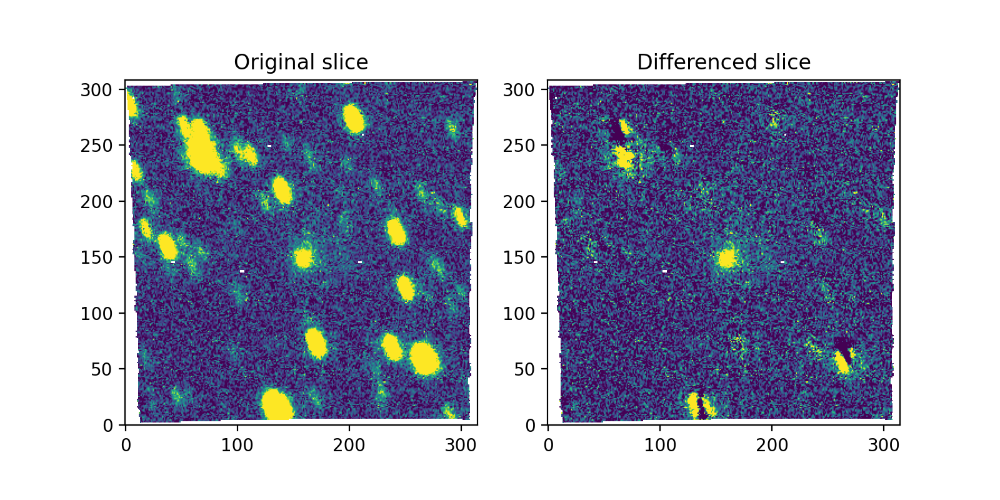

In [44]:
i = 1000
vmin = -10
vmax = 50
plt.figure(figsize=(8,4))
plt.subplot(121)
plt.title('Original slice')
plt.imshow(test.cube[i],origin='lower',vmin=vmin,vmax=vmax)
plt.subplot(122)
plt.title('Differenced slice')
plt.imshow(test.diff[i],origin='lower',vmin=vmin,vmax=vmax)

#plt.savefig('new_datapsf_sub.png')

<IPython.core.display.Javascript object>


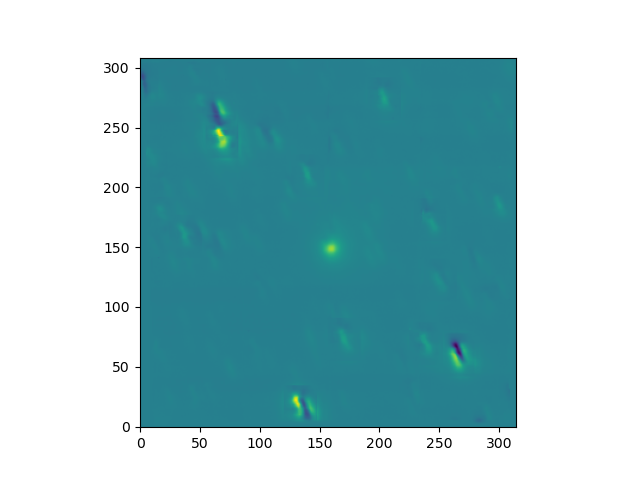

In [45]:
plt.figure()
plt.imshow(np.nansum(test.diff,axis=0),origin='lower')

In [3]:
vmin = np.nanmean(test.bkg)
vmax = np.nanmax(test.image) * 0.1

In [67]:
x = np.arange(0,test.psf.data_psf.shape[1])
y = np.arange(0,test.psf.data_psf.shape[0])
xx, yy = np.meshgrid(x, y)
XX, YY = np.meshgrid(test.psf.X-0.5,test.psf.Y-0.5)

In [69]:
from scipy.interpolate import griddata
estimate = griddata((xx.ravel(), yy.ravel()), test.psf.data_psf.ravel(),
                    (XX.ravel(),YY.ravel()),method='linear',fill_value=0)

estimate = estimate.reshape(len(test.psf.Y),len(test.psf.X))
estimate /= np.nansum(estimate)

<IPython.core.display.Javascript object>


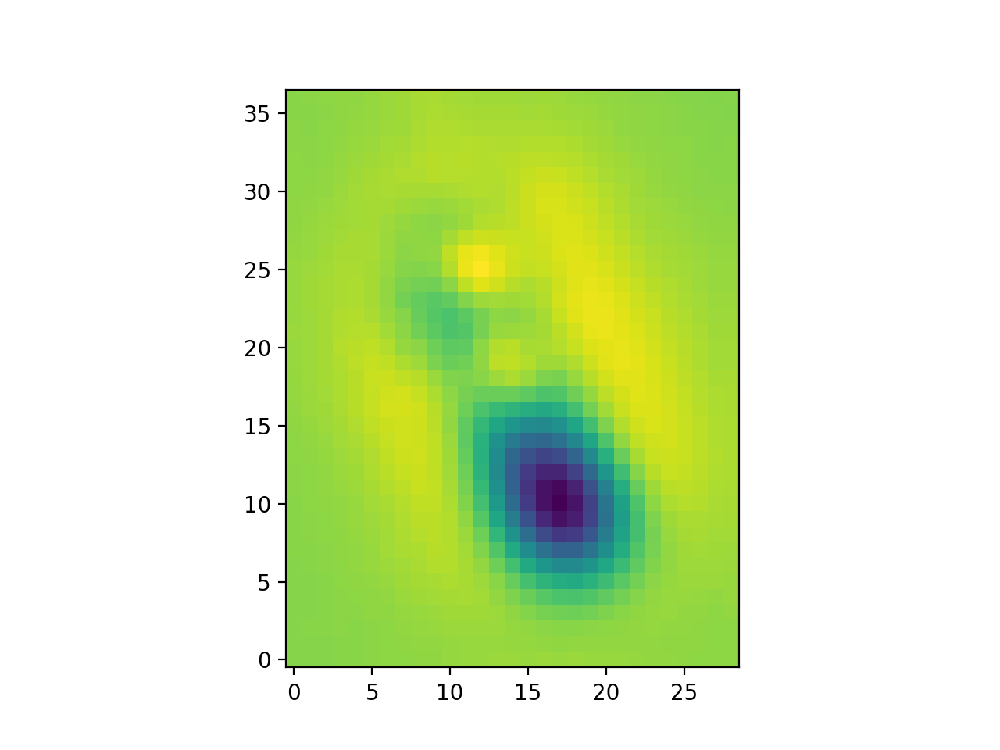

<IPython.core.display.Javascript object>


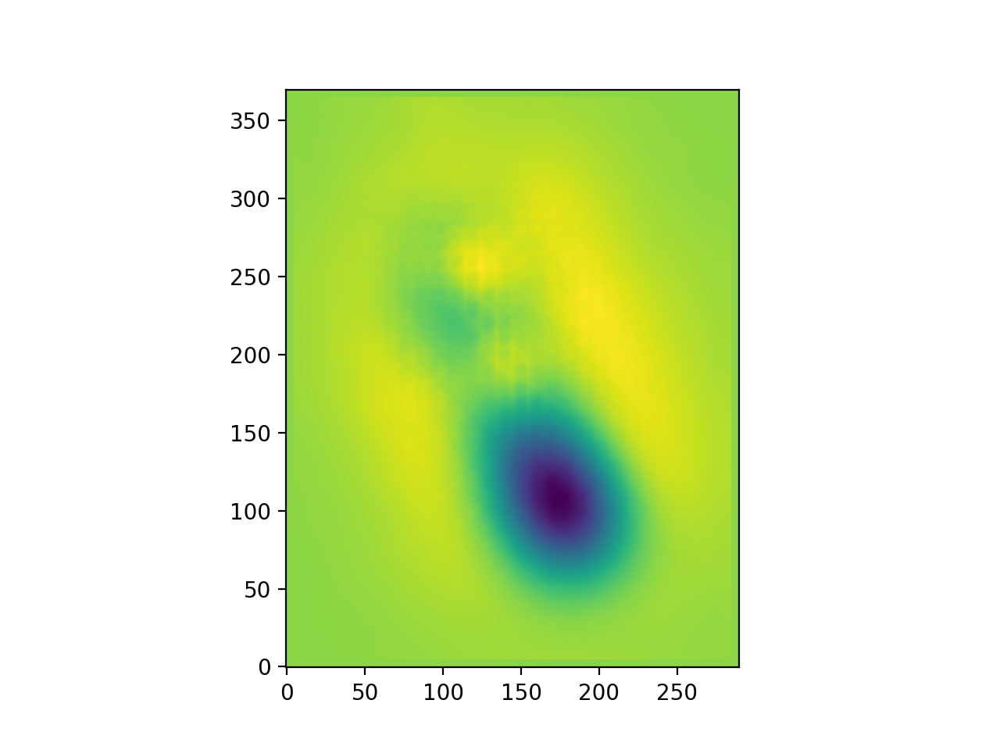

In [78]:
plt.figure()
plt.imshow(test.psf.data_psf-test.psf.longpsf,origin='lower')

plt.figure()
plt.imshow(estimate-test.psf.longPSF,origin='lower')

In [79]:
from skimage.util.shape import view_as_windows

def downSample2d(arr,sf):
    #isf2 = 1.0/(sf*sf)
    (A,B) = arr.shape
    windows = view_as_windows(arr, (sf,sf), step = sf)
    return windows.sum(3).sum(2)#*isf2

In [80]:
e = downSample2d(estimate,10)
#e /= np.nansum(e)

In [82]:
np.nansum(e)

0.9999999999999998

<IPython.core.display.Javascript object>


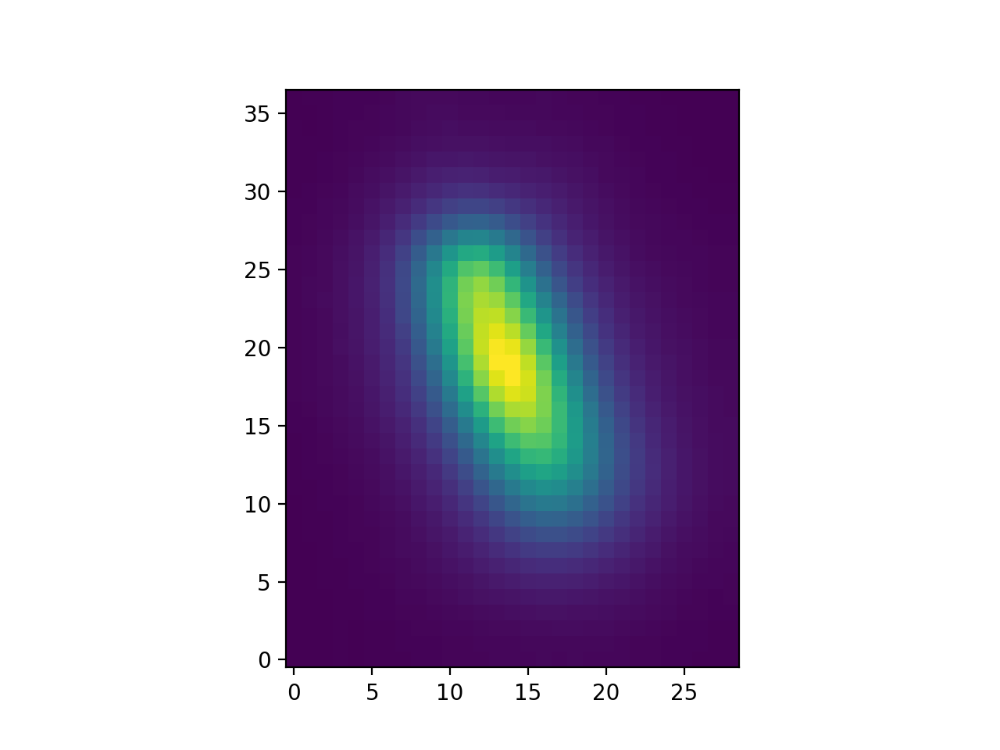

<IPython.core.display.Javascript object>


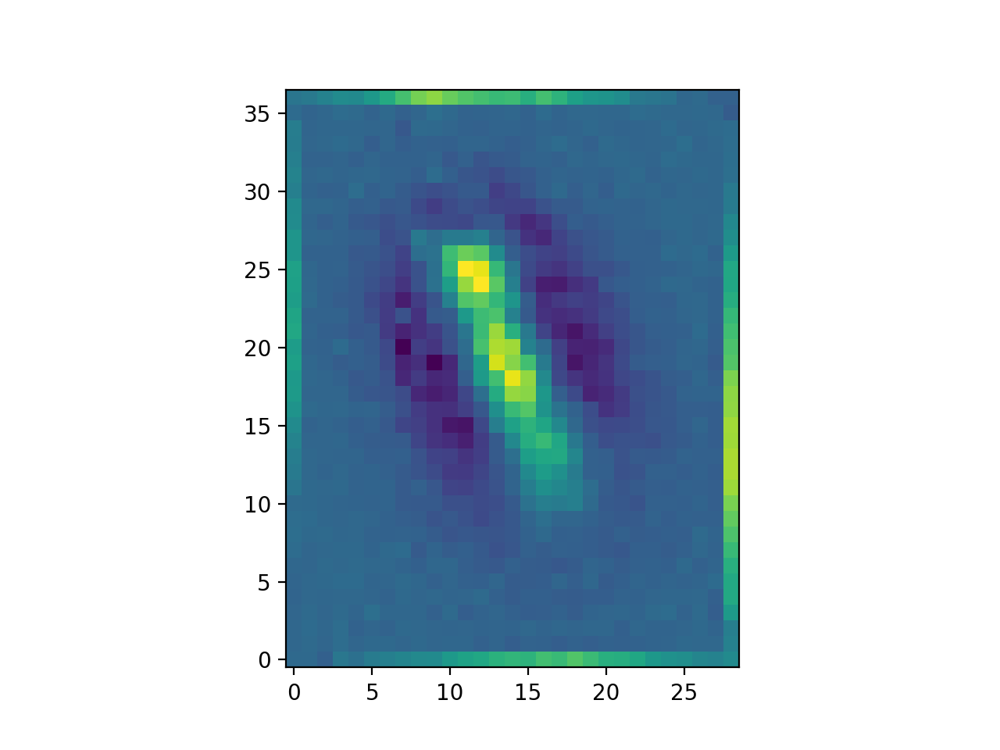

In [76]:
plt.figure()
plt.imshow((test.psf.data_psf-e)/2,origin='lower')

<IPython.core.display.Javascript object>


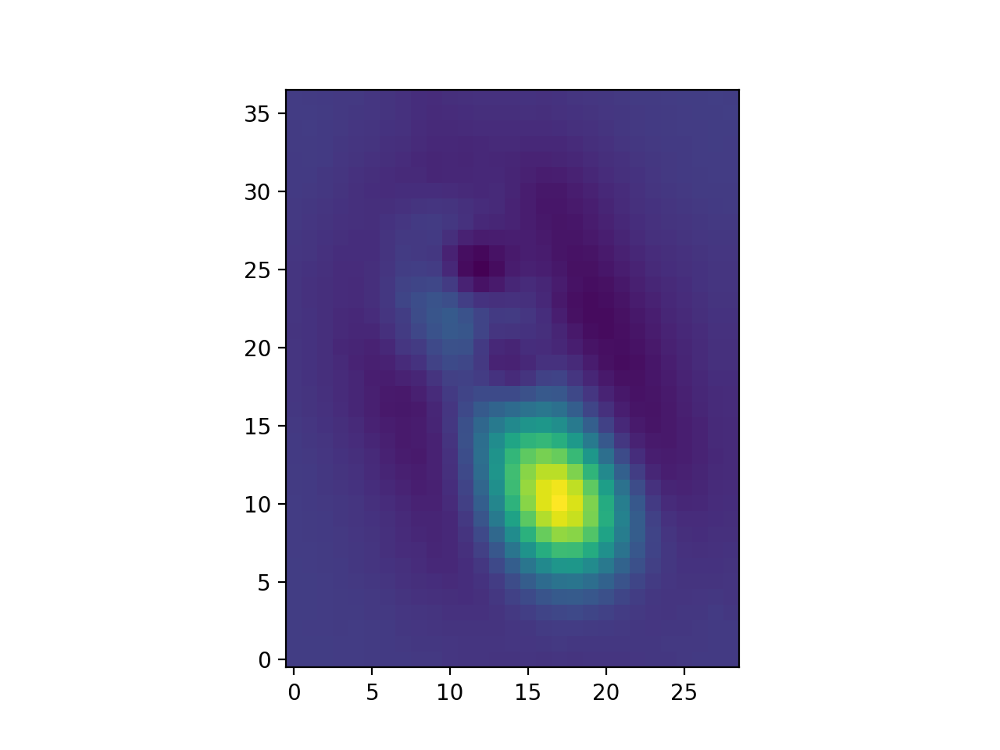

In [3]:
plt.figure()
plt.imshow(test.psf.longpsf-test.psf.data_psf,origin='lower')

<IPython.core.display.Javascript object>


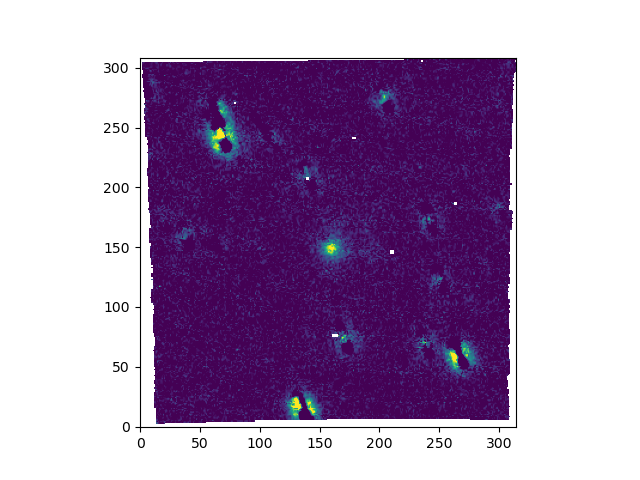

In [5]:
plt.figure()
plt.imshow(test.diff[1800],vmin=vmin,vmax=vmax,origin='lower')

In [15]:
test.cal_cuts.shape

(6, 37, 29)

In [56]:
'a' in 'a_be'

True

In [60]:
medcuts = test.cal_cuts / np.nanmax(test.cal_cuts,axis=(1,2))[:,np.newaxis,np.newaxis]
sm = np.zeros_like(medcuts)
for i in range(len(medcuts)):
    test.psf.fit_pos(medcuts[i])
    sm[i] = shift(medcuts[i],[-test.psf.source_y,-test.psf.source_x],mode='nearest')

In [61]:
datapsf = np.nanmedian(sm,axis=0)
datapsf = datapsf/np.nansum(datapsf)

In [66]:
np.sum(abs(datapsf-test.psf.longpsf))

0.2638642843350859

<IPython.core.display.Javascript object>


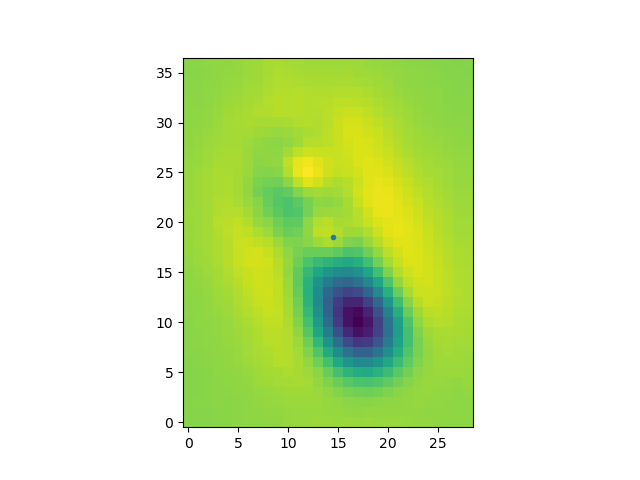

In [64]:
plt.figure()
plt.imshow(datapsf-test.psf.longpsf,origin='lower')
plt.plot(tmp.shape[1]/2,tmp.shape[0]/2,'.')

In [17]:
from scipy.ndimage import shift

In [32]:
tmp = shift(medcuts[0],[-test.psf.source_y,-test.psf.source_x],mode='nearest')
#tmp = shift(medcuts[0],[0,10],mode='nearest')

<IPython.core.display.Javascript object>


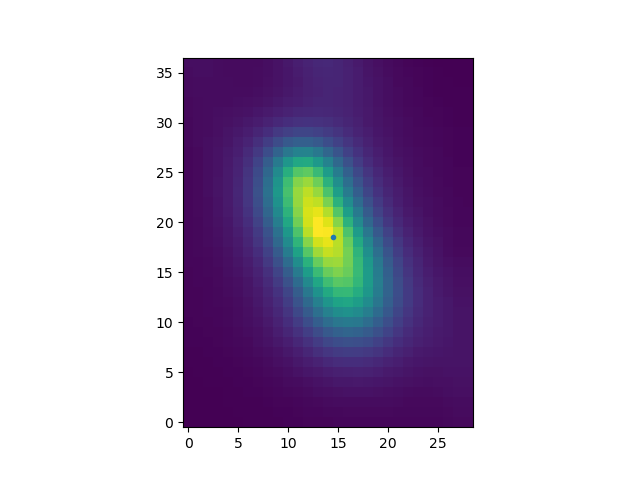

In [33]:
plt.figure()
plt.imshow(tmp,origin='lower')
plt.plot(tmp.shape[1]/2,tmp.shape[0]/2,'.')

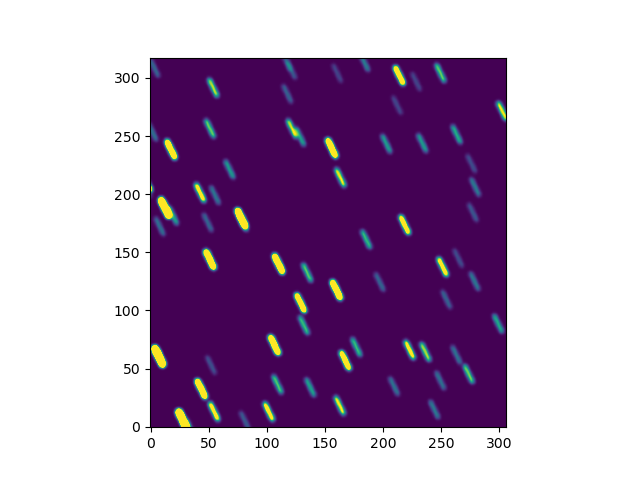

In [3]:
plt.figure()
plt.imshow(test.scene.sim[1800],vmax=100,origin='lower')

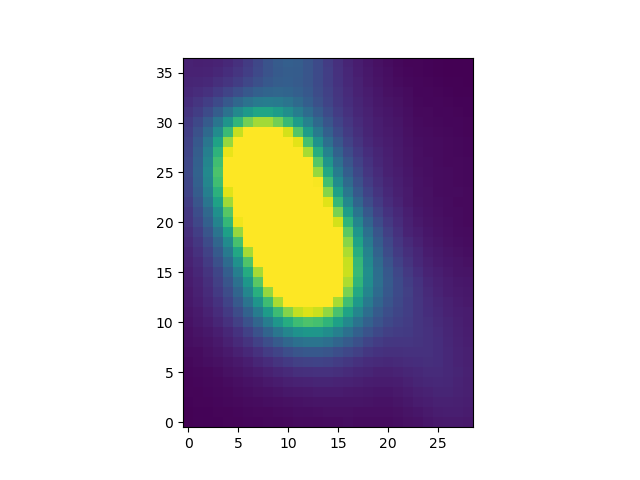

In [11]:
plt.figure()
plt.imshow(test.cal_cuts[0],vmax=500,origin='lower')

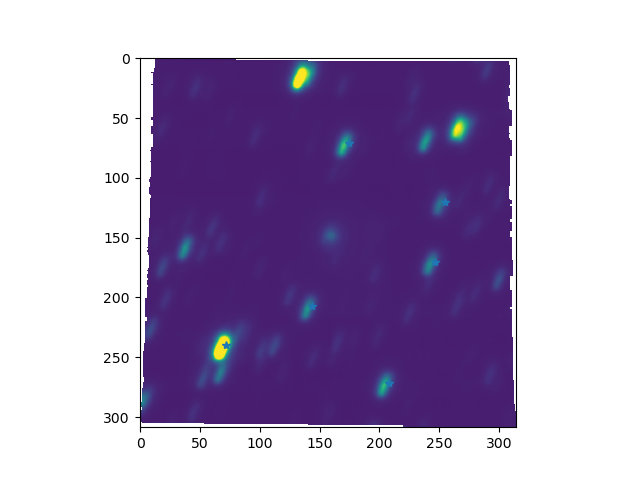

In [14]:
cals = test.cat.cal_source.values == 1 
plt.figure()
plt.imshow(test.image,vmax=500)
plt.plot(test.cat.x.values[cals],test.cat.y.values[cals],'*')

In [25]:
x = test.cat.xint.values[cals][0]
y = test.cat.yint.values[cals][0]

bleh = test.image[int(y-test.trail/2):int(y+test.trail/2),int(x-test.trail/2):int(x+test.trail/2)]



In [27]:
from scipy.ndimage.measurements import center_of_mass

In [38]:
bleh.shape

(33, 33)

In [49]:
yc,xc = center_of_mass(bleh)
xx = x + (xc-bleh.shape[1]/2); yy = y + (yc-bleh.shape[0]/2)

bleh2 = test.image[int(yy-test.trail/2):int(yy+test.trail/2),int(xx-test.trail/2):int(xx+test.trail/2)]
yc2,xc2 = center_of_mass(bleh2)
xxx = xx + (xc2-bleh2.shape[1]/2); yyy = yy + (yc2-bleh2.shape[0]/2)

In [54]:
test.psf.fit_pos(bleh2)

ValueError: operands could not be broadcast together with shapes (33,33) (37,29) 

In [51]:
yy-y

2.211747760880428

In [52]:
yyy-y

2.8909785846275895

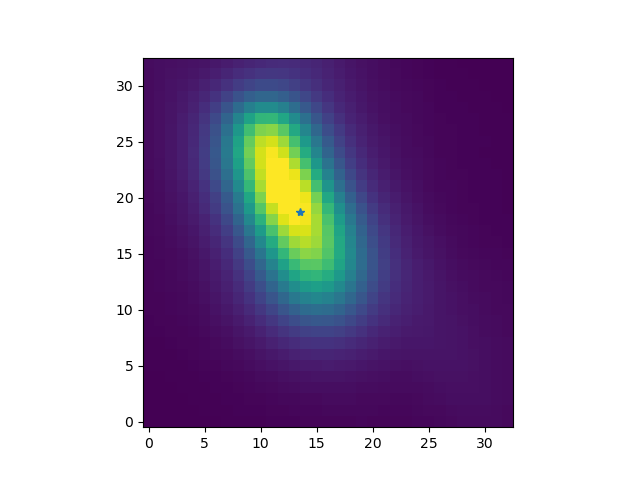

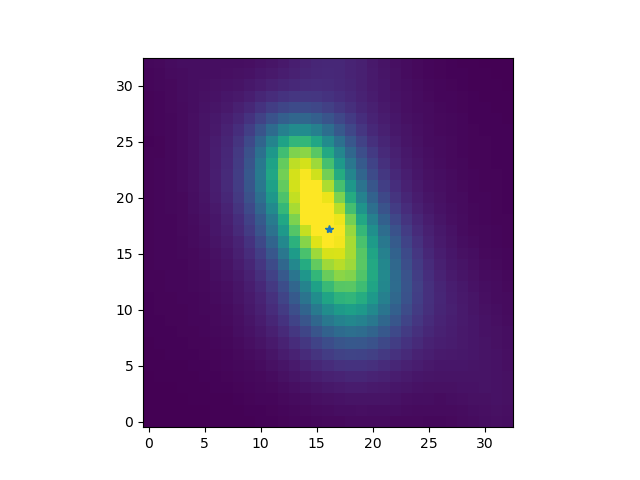

In [53]:
plt.figure()
plt.imshow(bleh,vmax=1300,origin='lower')
plt.plot(xc,yc,'*')

plt.figure()
plt.imshow(bleh2,vmax=1300,origin='lower')
plt.plot(xc2,yc2,'*')

In [18]:
test.trail

32.802438933713454

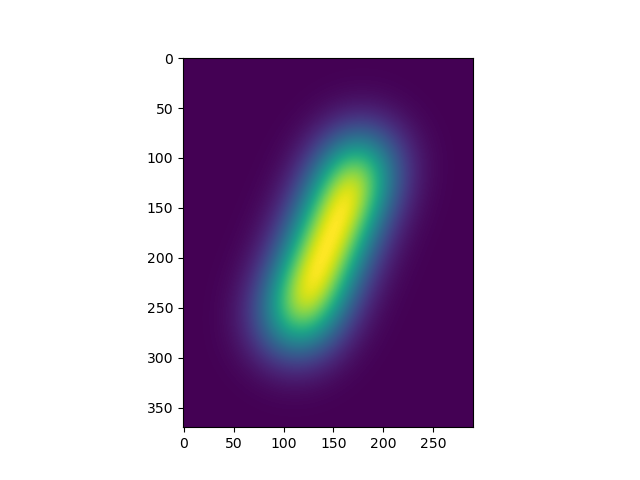

In [5]:
plt.figure()
plt.imshow(test.psf.longPSF)

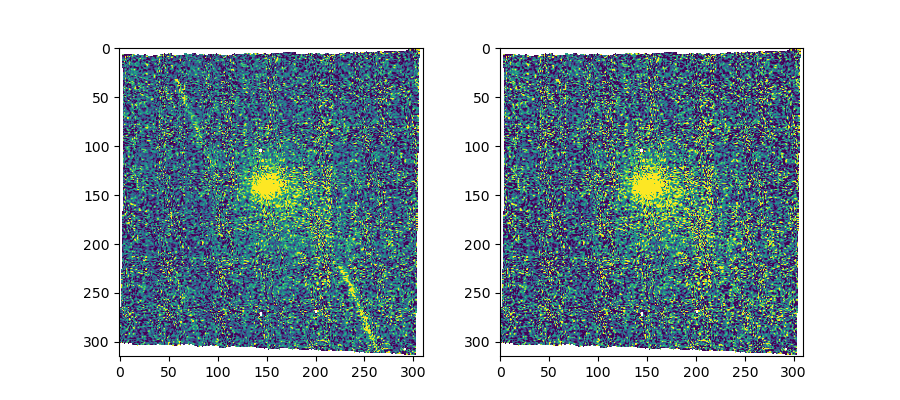

In [3]:
i = 300
mi = np.nanpercentile(test.cube[i],16)
ma = np.nanpercentile(test.cube[i],95)
plt.figure(figsize=(9,4))
plt.subplot(121)
plt.imshow(test.cube[i],vmin=mi,vmax=ma)
plt.subplot(122)
plt.imshow(test.diff[i],vmin=mi,vmax=ma)

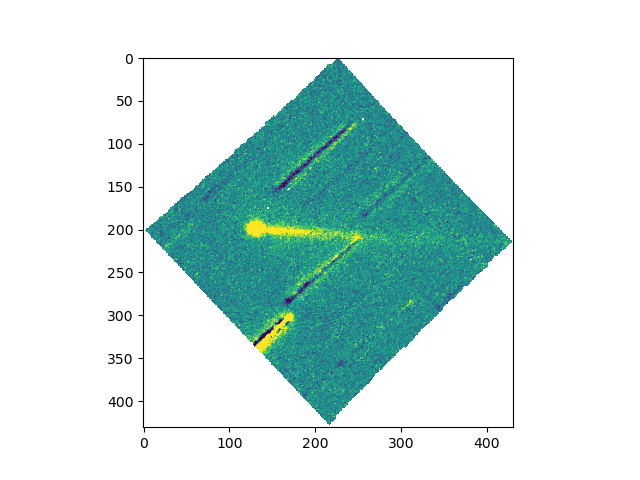

In [21]:
d = test.cube[i] - test.scene.sim[i]*.8

plt.figure()
plt.imshow(d,vmin=-50,vmax=50)

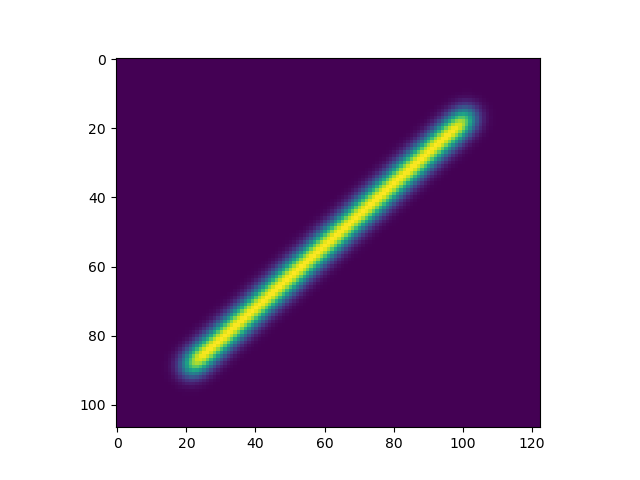

In [11]:
plt.figure()
plt.imshow(test.psf.longpsf)

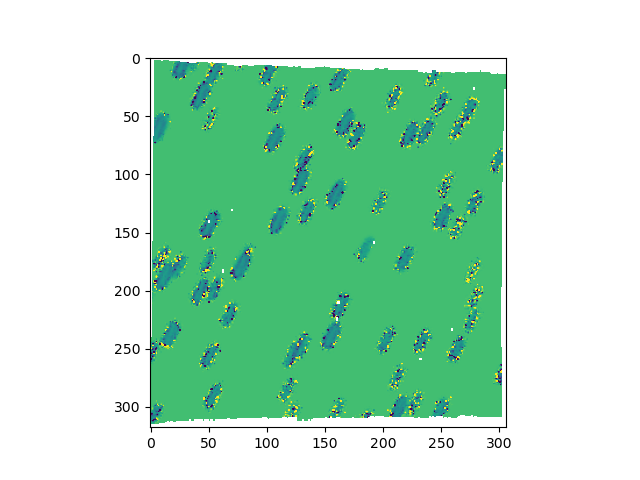

In [12]:
plt.figure()

plt.imshow((test.diff[i]/test.cube[i]),vmax=3,vmin=-3)

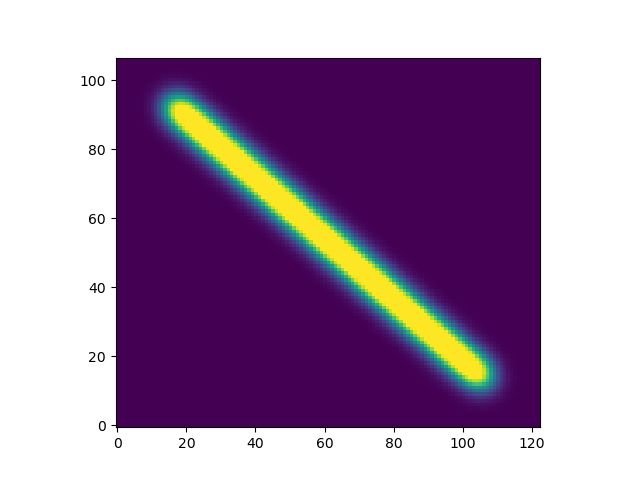

In [13]:
plt.figure()
plt.imshow(test.psf.longpsf,origin='lower',vmax= np.percentile(test.psf.longpsf,95))

In [ ]:
def complex_isolation_cals(self,dist=8,cal_maglim):
    xx = self.cat.xint.values; yy = self.cat.yint.values
    ang = np.radians(self.angle)
    cx = self.image.shape[1]/2; cy = self.image.shape[0]/2
    xxx = cx + ((xx-cx)*np.cos(ang)-(yy-cy)*np.sin(ang))
    yyy = cy + ((xx-cx)*np.sin(ang)+(yy-cy)*np.cos(ang))
    
    dmag = 2
    mags = self.cat[self.ref_filter].values
    dmags = mags[:,np.newaxis] - mags[np.newaxis,:]
    ind = dmags > dmag

    dy = abs(yyy[:,np.newaxis] - yyy[np.newaxis,:])
    dy[dy==0] = 1e3
    dy[ind] = 1e3

    dx = abs(xxx[:,np.newaxis] - xxx[np.newaxis,:])
    dx[dx==0] = 1e3
    dx[ind] = 1e3
    
    iy,ix = np.where(dx > xdist)
    dy[iy,ix] = 1e3
    iy,ix = np.where(dx < xdist)
    ii = dy[iy,ix] > self.trail*1.2
    dx[iy[ii],ix[ii]] = 1e3
    dy[iy[ii],ix[ii]] = 1e3
    isoind = (np.nanmin(dy,axis=0) > self.trail*1.2) & (mags <cal_maglim)
    self.cat['cal_source'] = 0 
    self.cat['cal_source'].iloc[isoind] = 1
    

In [283]:
xx = test.cat.xint.values; yy = test.cat.yint.values
ang = np.radians(test.angle)
cx = test.image.shape[1]/2; cy = test.image.shape[0]/2
xxx = cx + ((xx-cx)*np.cos(ang)-(yy-cy)*np.sin(ang))
yyy = cy + ((xx-cx)*np.sin(ang)+(yy-cy)*np.cos(ang))


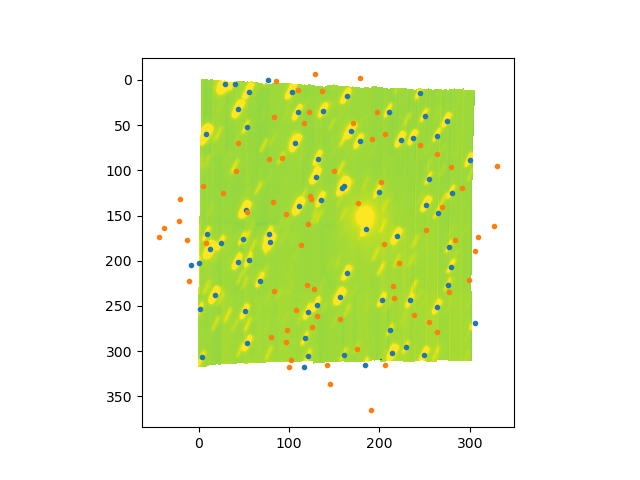

In [221]:
plt.figure()
plt.imshow(test.image,vmax=20)
plt.plot(xx,yy,'.')
plt.plot(xxx,yyy,'.')

In [284]:
dmag = 2
mags = test.cat[test.ref_filter].values
dmags = mags[:,np.newaxis] - mags[np.newaxis,:]
ind = dmags > dmag

dy = abs(yyy[:,np.newaxis] - yyy[np.newaxis,:])
dy[dy==0] = 1e3
dy[ind] = 1e3

dx = abs(xxx[:,np.newaxis] - xxx[np.newaxis,:])
dx[dx==0] = 1e3
dx[ind] = 1e3

In [285]:
iy,ix = np.where(dx > 8)
dy[iy,ix] = 1e3
iy,ix = np.where(dx < 8)


In [286]:
ii = dy[iy,ix] > test.trail*1.2

In [287]:
dx[iy[ii],ix[ii]] = 1e3
dy[iy[ii],ix[ii]] = 1e3

In [288]:
dmags[iy[ii],ix[ii]]

array([-1.155113, -0.504194, -0.869145, -2.173227, -0.819462, -1.437731,
       -1.627505, -1.76768 , -1.96464 , -2.047825, -2.73157 , -0.66225 ,
       -1.797895, -2.500833, -2.524646, -2.545728, -1.225107, -2.121992,
       -2.508373, -2.669941,  0.504194, -0.364951, -1.669033, -2.012249,
        1.155113, -2.628708, -1.247748, -2.117233,  0.869145,  0.364951,
       -1.304082, -1.647298, -2.527811,  0.819462, -0.618269, -0.694048,
       -0.948218, -1.145178, -1.228363, -1.590933, -1.814184,  0.66225 ,
       -1.135645, -1.838583, -1.862396, -1.883478, -0.401978, -0.555204,
       -1.473366, -2.137981, -1.440636, -1.647972, -2.004406,  1.437731,
        0.618269, -0.189774, -0.329949, -0.526909, -0.610094, -0.972664,
        1.225107,  0.694048, -0.113995, -0.534315, -0.896885, -1.283266,
       -0.31935 ,  1.627505,  0.189774,  0.113995, -0.140175, -0.337135,
       -0.42032 , -0.78289 , -1.104065,  0.401978, -0.153226, -1.071388,
       -1.736003, -0.620573,  1.247748,  1.76768 , 

In [289]:
isoind = (np.nanmin(dy,axis=0) > test.trail*1.5) & (mags <19)

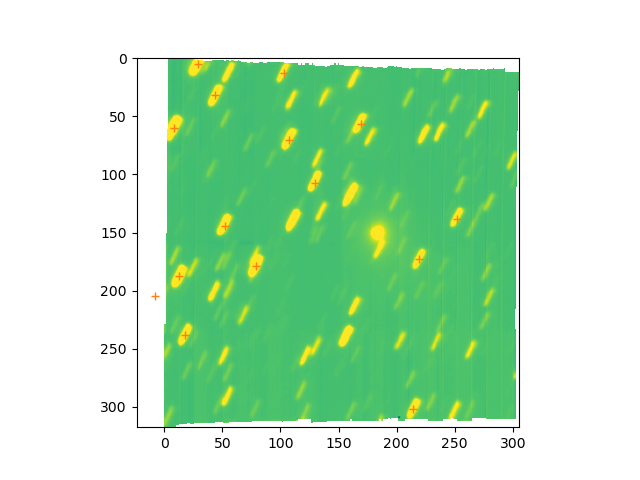

In [290]:
iso = test.cat.iloc[isoind]
plt.figure()
plt.imshow(test.image,vmax=50)
plt.plot(iso.xint.values,iso.yint.values,'C1+')

In [232]:
test.trail

21.633307652783937

In [233]:
lys = []
lxs = []
for j in range(10):
    try:
        lengthx = np.arange(-test.trail/2,test.trail/2,1,dtype=int)
        lxs += [deepcopy(lengthx)]
        lengthy = (np.tan(ang) * lengthx + test.cat.yint.values[j]).astype(int)
        lengthx += (test.cat.xint.values[j]).astype(int)
        lys += [test.image[lengthy,lengthx]]
    except:
        pass


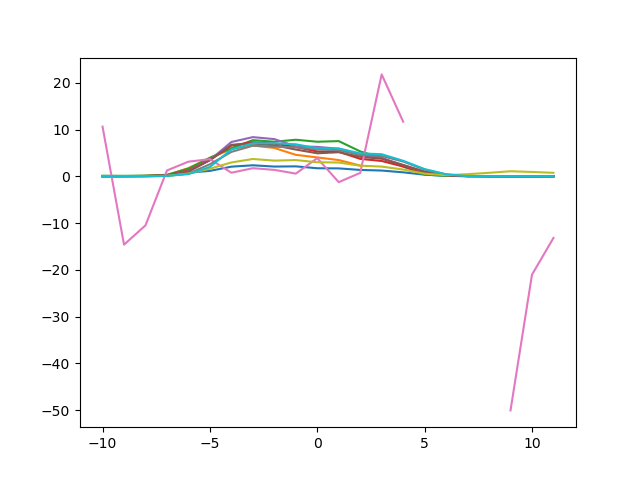

In [234]:
plt.figure()
for i in range(len(lys)):
    plt.plot(lxs[i],lys[i]/np.nanmedian(lys[i]))

In [239]:

j = 2


lengthx = np.arange(-test.trail/2,test.trail/2,1,dtype=int)
lengthy = (np.tan(ang) * lengthx + test.cat.yint.values[j]).astype(int)
lengthx += (test.cat.xint.values[j]).astype(int)

xs = np.arange(-10,11,1) 
ys = np.tan(-ang) * xs + test.cat.yint.values[j]
ys = (ys).astype(int)
xs += (test.cat.xint.values[j]).astype(int)


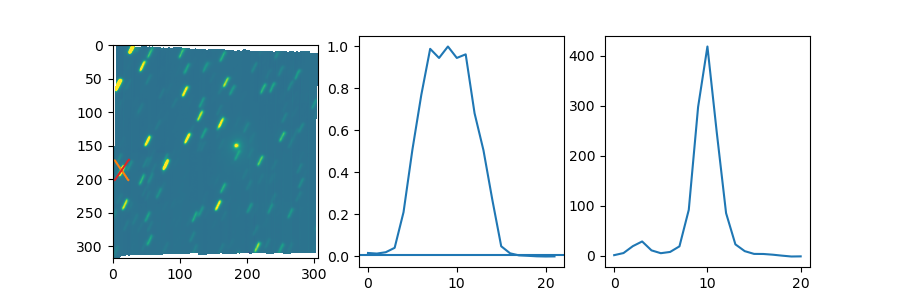

In [240]:
plt.figure(figsize=(9,3))
plt.subplot(131)
plt.imshow(test.image,vmax=200)
plt.plot(xs,ys,'C1-')
plt.plot(lengthx,lengthy,'C3-')

plt.subplot(132)
long = test.image[lengthy,lengthx]
plt.plot(long/np.nanmax(long))
plt.axhline(np.percentile(long/np.nanmax(long),20))

plt.subplot(133)
plt.plot(test.image[ys,xs])

In [241]:
def ang_line(theta,x0,y0,length):
    lengthx = np.arange(-length/2,length/2+1,1)
    lengthy = (np.tan(theta) * lengthx + y0)
    lengthx += x0
    line = np.array([(lengthx+.5).astype(int),(lengthy+.5).astype(int)])
    return line

def interp_image(coords,image):
    #y,x = image.shape
    #X,Y = np.meshgrid(np.arange(0,x),np.arange(0,y))
    #interp = interp2d(Y,X,image.ravel())
    #i = interp(coords[0],coords[1])
    i = image[coords[1],coords[0]]
    return i
    

def line_minimizer(x0,x,y,length,image):
    line = ang_line(x0[0],x+x0[1],y+x0[2],length)
    interp = interp_image(line,image)
    return -np.nansum(interp)


    

In [242]:
x0 = [ang,0,0]
bounds = [[]]
r = minimize(line_minimizer,x0,args=(test.cat.xint.values[j],test.cat.yint.values[j],test.trail,test.image),method='Nelder-Mead')

In [243]:
(ang - r.x[0])/np.pi * 180

-0.23121448755138324

In [244]:
l = ang_line(r.x[0],test.cat.xint.values[1]+r.x[1],test.cat.yint.values[1]+r.x[2],test.trail)
eh = interp_image(l,test.image)
tlength = np.max(np.diff(np.where(eh/np.nanmedian(eh)<0.5)[0]))

In [245]:
np.where(eh/np.nanmax(eh)<0.2)[0]

array([ 0,  1,  2,  3,  4, 18, 19, 20, 21, 22])

In [246]:
sig = np.where(eh/np.nanmedian(eh)<0.5)[0]
max_ind = np.argmax(np.diff(sig))
index = np.nanmean([sig[max_ind],sig[max_ind+1]])

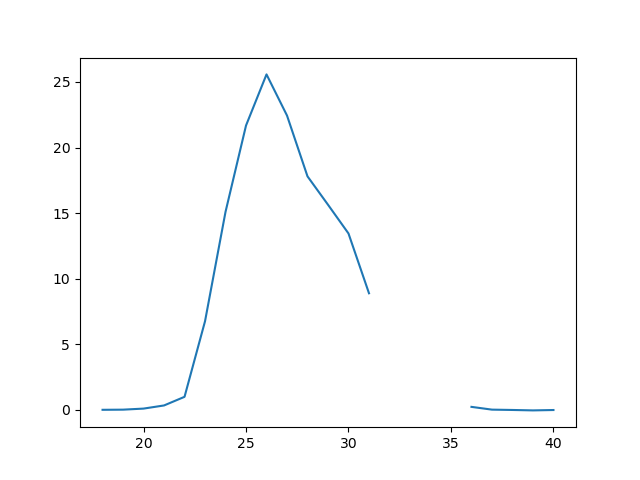

In [247]:
plt.figure()
plt.plot(l[0],eh/np.nanmedian(eh))

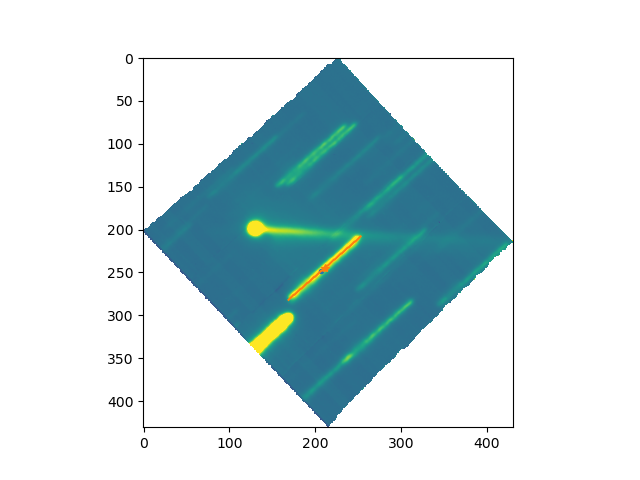

In [188]:
plt.figure()
plt.imshow(test.image,vmax=100)
plt.plot(sx,sy,'.')


plt.plot(l[0,int(index+.5)],l[1,int(index+.5)],'*')
ll = ang_line(r.x[0],l[0,int(index)],l[1,int(index)],tlength)
arg = interp_image(ll,test.image)
plt.plot(ll[0],ll[1],'C1-')

In [248]:
def moffat(alpha,beta,x0,x):
    """
    Return a moffat profile evaluated at the radii in the input numpy array.
    """
    a2=alpha**2
    m = ((beta-1)/(np.pi*a2))*(1.+(x-x0/alpha)**2)**(-beta)
    #m /= np.nanmax(m)
    return m




def mofat1d_minimizer(x0,x,y):
    x -= np.mean(x)
    m = moffat(x0[0],x0[1],x0[2],x)
    res = np.nansum((m-y)**2)
    return res

from astropy.modeling.functional_models import Gaussian1D

def gaussian_minimizer(x0,x,y):
    g = Gaussian1D(x0[0],x0[1],x0[2])
    res = np.nansum((g(x)-y)**2)
    return res

In [253]:
res

       message: Maximum number of function evaluations has been exceeded.
       success: False
        status: 1
           fun: 0.04270692042403907
             x: [ 3.370e-02  1.004e+00 -5.325e-03]
           nit: 341
          nfev: 600
 final_simplex: (array([[ 3.370e-02,  1.004e+00, -5.325e-03],
                       [ 3.419e-02,  1.004e+00, -5.403e-03],
                       [ 3.408e-02,  1.004e+00, -5.409e-03],
                       [ 3.420e-02,  1.004e+00, -5.383e-03]]), array([ 4.271e-02,  4.271e-02,  4.271e-02,  4.271e-02]))

In [249]:
x0 = [3.8,4.765,0]
ynorm = test.image[ys,xs]
ynorm -= np.nanmin(ynorm)
ynorm /= np.nanmax(test.image[ys,xs])
xx = np.arange(-10,11,1)*1.
xx -= np.nanmean(xx)
res = minimize(mofat1d_minimizer,x0,args=(xx,ynorm),method='Nelder-Mead')

In [254]:
x0 = [1,0,2]
ynorm = test.image[ys,xs]
ynorm -= np.nanmin(ynorm)
ynorm /= np.nanmax(test.image[ys,xs])
xx = np.arange(-10,11,1)*1.
xx -= np.nanmean(xx)
gres = minimize(gaussian_minimizer,x0,args=(xx,ynorm),method='Nelder-Mead')

In [256]:
gres

       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 0.013808469844346605
             x: [ 9.911e-01 -8.859e-02  1.131e+00]
           nit: 125
          nfev: 225
 final_simplex: (array([[ 9.911e-01, -8.859e-02,  1.131e+00],
                       [ 9.911e-01, -8.865e-02,  1.131e+00],
                       [ 9.910e-01, -8.860e-02,  1.131e+00],
                       [ 9.911e-01, -8.851e-02,  1.131e+00]]), array([ 1.381e-02,  1.381e-02,  1.381e-02,  1.381e-02]))

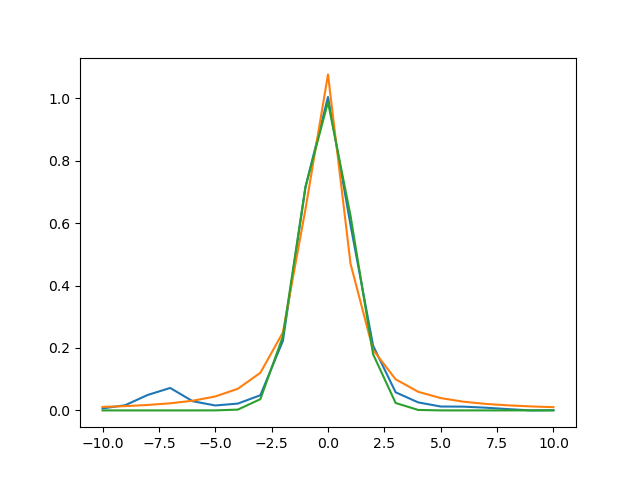

In [255]:
plt.figure()
plt.plot(xx,ynorm)
plt.plot(xx,moffat(res.x[0],res.x[1],res.x[2],xx))
plt.plot(xx,Gaussian1D(gres.x[0],gres.x[1],gres.x[2])(xx))

In [261]:
from astropy.modeling.functional_models import Gaussian2D

In [278]:
'gaussian' in ['gaussian','moffat']

True

In [264]:
g2d = Gaussian2D(x_stddev=1.1,y_stddev=1.1)

In [273]:
X,Y = np.meshgrid(np.arange(-5,5,.01),np.arange(-5,5,.01))

In [274]:
z = g2d(X,Y)

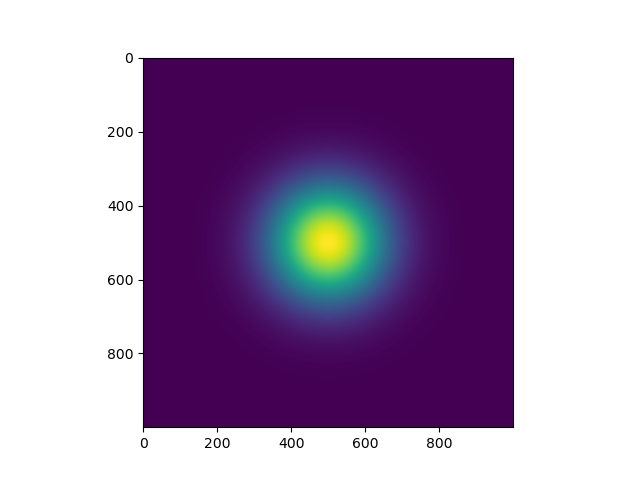

In [275]:
plt.figure()
plt.imshow(z)

In [258]:
ress = []
for j in range(len(ll[0])):
    xs = np.arange(-10,11,1) 
    ys = np.tan(-ang) * xs + ll[1,j]
    ys = (ys).astype(int)
    xs += (ll[0,j]).astype(int)
    x0 = [1,0,2]
    ynorm = test.image[ys,xs]
    ynorm -= np.nanmin(ynorm)
    ynorm /= np.nanmax(test.image[ys,xs])
    xx = np.arange(-10,11,1)*1.
    xx -= np.nanmean(xx)
    res = minimize(gaussian_minimizer,x0,args=(xx,ynorm),method='Nelder-Mead')
    #print(res.x)
    ress += [res.x]
ress = np.array(ress)

In [259]:
xx = np.arange(-10,11,0.1) 
gausspsf = []
for i in range(len(ress)):
    gausspsf += [Gaussian1D(ress[i][0],0,ress[i][2])(xx)]
gausspsf = np.array(gausspsf)    

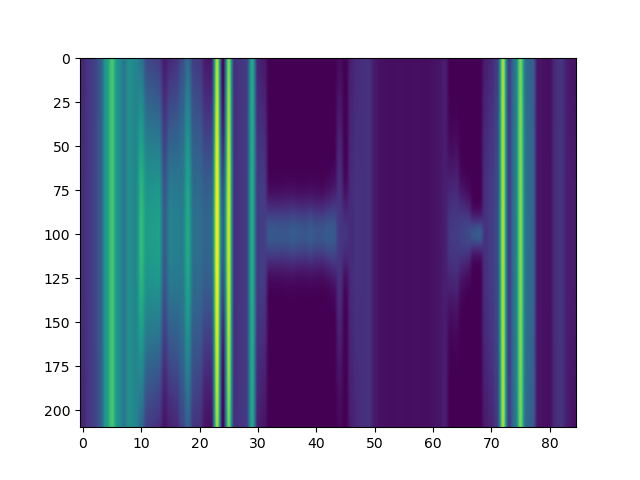

In [260]:
plt.figure()
plt.imshow(gausspsf.T,aspect='auto')

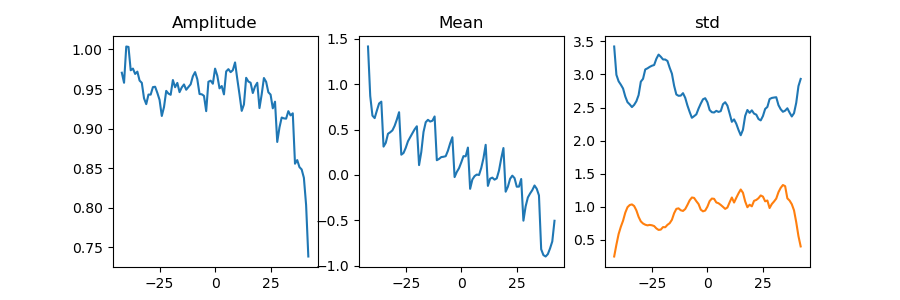

In [193]:
plt.figure(figsize=(9,3))
plt.subplot(131)
plt.title('Amplitude')
plt.plot(ll[0,:]-l[0,int(index+.5)],ress[:,0])
plt.subplot(132)
plt.title('Mean')
plt.plot(ll[0,:]-l[0,int(index+.5)],ress[:,1])
plt.subplot(133)
plt.title('std')
plt.plot(ll[0,:]-l[0,int(index+.5)],ress[:,2])
plt.plot(ll[0,:]-l[0,int(index+.5)],arg/np.nanmedian(arg))

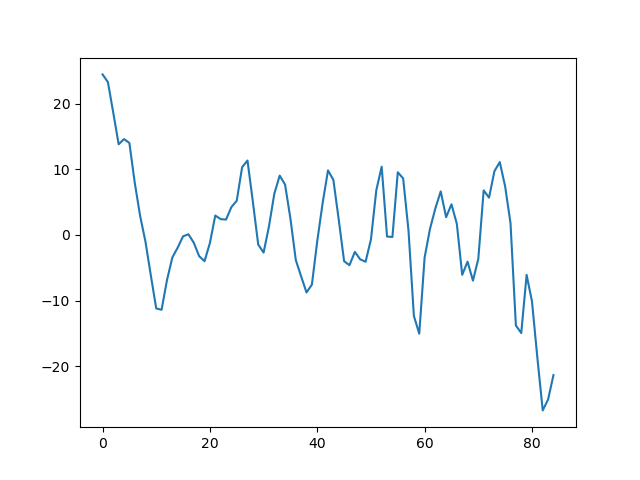

In [198]:
grads = np.gradient(arg)
plt.figure()
plt.plot(grads)

In [56]:
sx = test.cat.xint.values[j]; sy = test.cat.yint.values[j]
leng_step = np.arange(-tlength/2,tlength/2+1)
xx = sx - np.cos(ang)*leng_step
yy = sy - np.sin(ang)*leng_step
#for i in range(tlength):
    

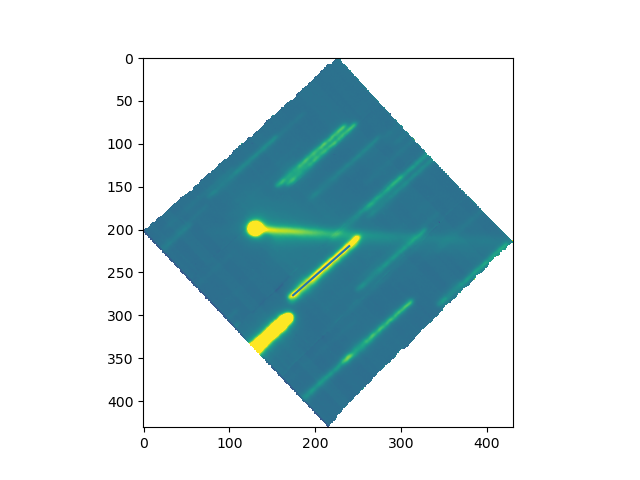

In [61]:
plt.figure()
plt.imshow(test.image,vmax=100)
plt.plot(xx,yy)

In [564]:
res

       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 0.011792756789332054
             x: [ 9.957e-01  4.655e-01  2.245e+00]
           nit: 115
          nfev: 205
 final_simplex: (array([[ 9.957e-01,  4.655e-01,  2.245e+00],
                       [ 9.957e-01,  4.654e-01,  2.245e+00],
                       [ 9.957e-01,  4.654e-01,  2.245e+00],
                       [ 9.957e-01,  4.655e-01,  2.245e+00]]), array([ 1.179e-02,  1.179e-02,  1.179e-02,  1.179e-02]))

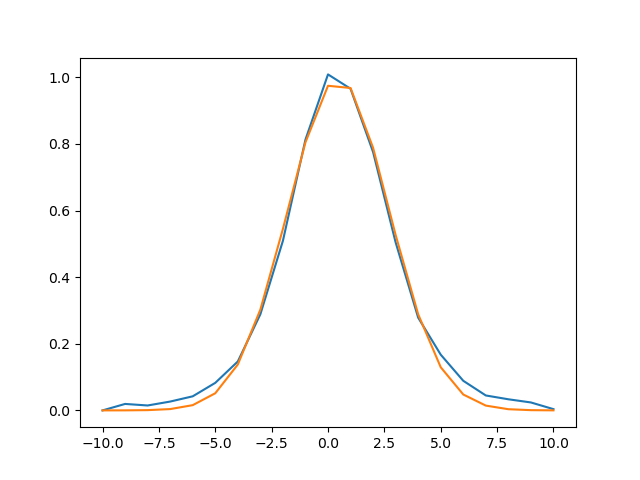

In [565]:
plt.figure()
x0 = [20,8,0]
plt.plot(xx,ynorm)
plt.plot(xx,Gaussian1D(res.x[0],res.x[1],res.x[2])(xx))
#plt.plot(xx,moffat(res.x[0],res.x[1],res.x[2],xx))

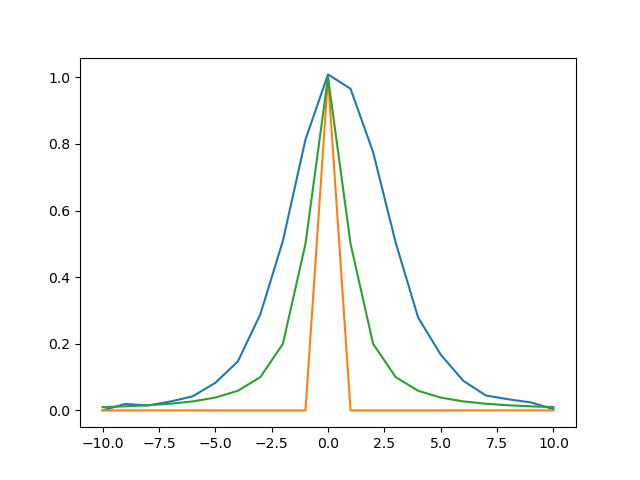

In [555]:
plt.figure()
x0 = [1e-5,1e200,0]
plt.plot(xx,ynorm)
plt.plot(xx,moffat(x0[0],x0[1],x0[2],xx))
plt.plot(xx,moffat(res.x[0],res.x[1],res.x[2],xx))

In [299]:
from scipy.ndimage import rotate

In [316]:
eh = deepcopy(test.image)
eh[np.isnan(eh)] = 0
r = rotate(eh,-test.angle)
r[abs(r)<1e-5] = np.nan

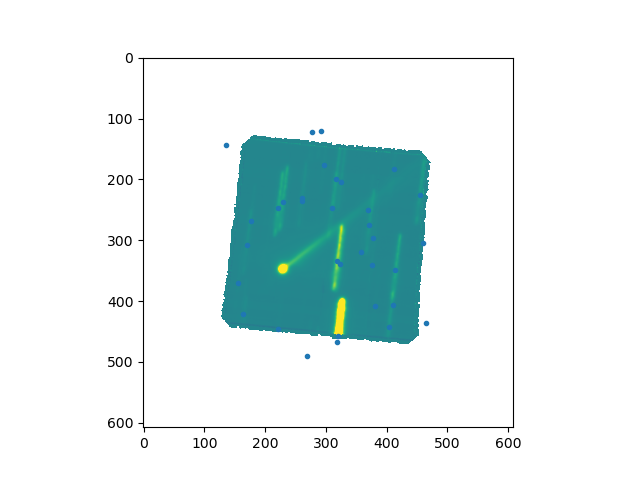

In [321]:
plt.figure()
plt.imshow(r,vmax=200)
plt.plot(xxx+r.shape[1]/2-eh.shape[1]/2,yyy+r.shape[0]/2-eh.shape[0]/2,'.')

In [68]:
len(dx)

34

In [66]:
(dx < 8)[ii]

IndexError: boolean index did not match indexed array along dimension 0; dimension is 34 but corresponding boolean dimension is 72

In [51]:
dx = np.nanmin(dx,axis=0)

In [52]:
dx

array([ 0.94072087,  0.37628835,  3.10437887,  7.71391112,  0.56443252,
        5.36210895,  1.88144174,  0.37628835,  7.33762277,  1.97551382,
        1.22293713,  6.77319025,  1.88144174,  5.55025312,  0.37628835,
        4.70360434,  0.75257669,  0.75257669,  4.70360434,  5.55025312,
        4.70360434,  7.80798321,  7.24355069,  7.24355069,  9.03092034,
        2.35180217,  1.22293713,  0.37628835,  2.35180217,  4.70360434,
        0.56443252, 12.32344338,  3.10437887, 20.31957076])

In [24]:
labeled, nr_objects = label(test.bright_mask > 0) 

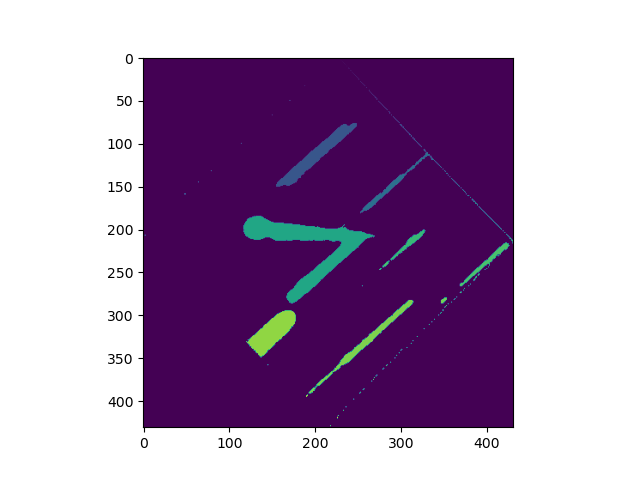

In [28]:
plt.figure()
plt.imshow(labeled)

In [3]:
2.35958576319067

TypeError: object of type 'cuber' has no len()

In [3]:
test.trail

112.2650251349283

In [3]:
test.psf_param

array([ 1.02500026e-01,  1.00000000e+00,  1.15071719e+02, -4.22155727e+01])

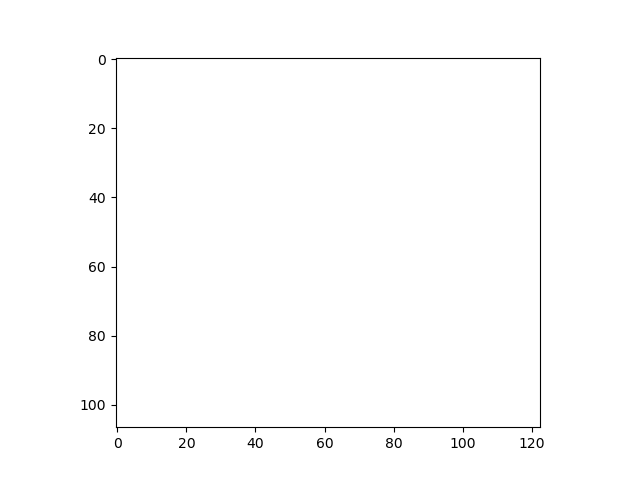

In [3]:
plt.figure()
plt.imshow(test.psf.longpsf)

In [157]:
psf = PSF_photom(test.cube[100],test.cat,test.psf_param,noise_floor=test.bkgstd[100])
psf._make_masks()
psf.group_sources()
psf.group_psf()



[[  0.           0.         177.86469987 171.35300251 393.96822277
  400.37357086]
 [ 12.15473694   8.73331054 197.86469987 191.35300251 413.96822277
  420.37357086]]
res r  219202554.18628392
res r  219202580.70017493
res r  219202554.5319779
res r  219202554.18628392
res r  219202554.18628392
res r  219202554.18628392
res r  219202554.18628392
res r  453270062.10756344
res r  233740668.90230978
res r  212107190.39569792
res r  212107195.65875876
res r  212107190.5146457
res r  212107190.39569792
res r  212107190.39569792
res r  212107190.39569792
res r  212107190.39569792
[[  0.           0.         258.5796225  259.32351476 300.27461929
  306.10949301]
 [  9.58900872   8.17350552 278.5796225  279.32351476 320.27461929
  326.10949301]]
res r  2754964.997066809
res r  2754965.1614229293
res r  2754965.011790575
res r  2754964.997066809
res r  2754964.997066809
res r  2754964.997066809
res r  2754964.997066809
res r  4569427.376608551
res r  2928707.190082331
res r  2680699.587629247
r

KeyboardInterrupt: 

In [ ]:
psf.cat

In [116]:
236480.41130459038 - 533286.8187866211

-296806.4074820307

In [ ]:
188. 181. 404. 410.

In [38]:
f0=[];x0=[];y0=[]
for key in list(psf.fluxes.keys()):
    f0 += [psf.fluxes[key]]
    ind = psf.cat.id.values == key
    x0 += [psf.cat.x.values[ind][0]]
    y0 += [psf.cat.y.values[ind][0]]
thing = np.array(f0)
thing = np.append(thing,np.array(x0),axis=0)
thing = np.append(thing,np.array(y0),axis=0)

ima = psf.make_psf_image_2(thing,psf.data,psf.cat)

63.86781

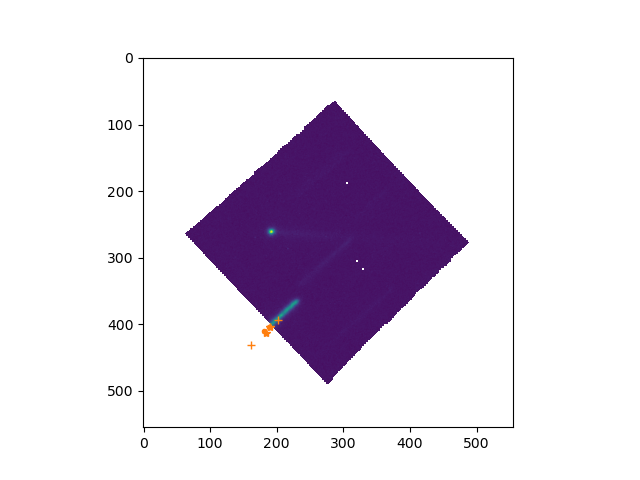

In [92]:
plt.figure()
plt.imshow(psf.data)
plt.plot([188.,181.],[404.,410.],'C1.')
plt.plot([201.88887046,161.63710748],[394.19948439,430.77472369],'C1+')
plt.plot([190.618034,183.618034],[404.381966,413.53076022],'C1*')


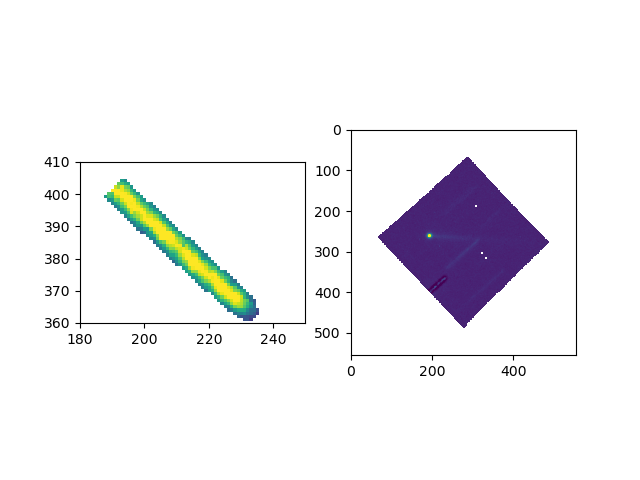

In [12]:
eh = (psf.data) * mask

plt.figure()
plt.subplot(121)
plt.imshow((psf.data) * mask,vmin=-100,vmax = np.nanpercentile(eh,80))
plt.xlim(180,250)
plt.ylim(360,410)

plt.subplot(122)
plt.imshow((psf.data - f),vmin=-100,vmax = np.nanpercentile(eh,80))
#plt.xlim(180,250)
#plt.ylim(360,410)

In [19]:
f0=[];x0=[];y0=[]
for key in list(psf.fluxes.keys()):
    f0 += [psf.fluxes[key]]
    ind = psf.cat.id.values == key
    x0 += [psf.cat.x.values[ind][0]]
    y0 += [psf.cat.y.values[ind][0]]
thing = np.array(f0)
thing = np.append(thing,np.array(x0),axis=0)
thing = np.append(thing,np.array(y0),axis=0)

ima = psf.make_psf_image_2(thing,psf.data,psf.cat)

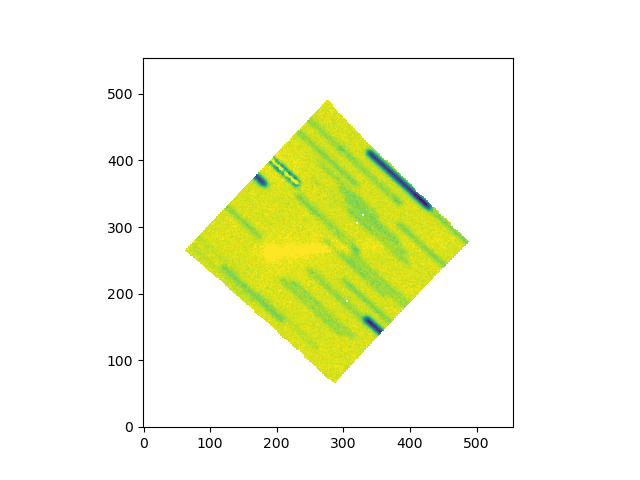

In [26]:
plt.figure()
plt.imshow(psf.data - ima,origin='lower',vmax=100)

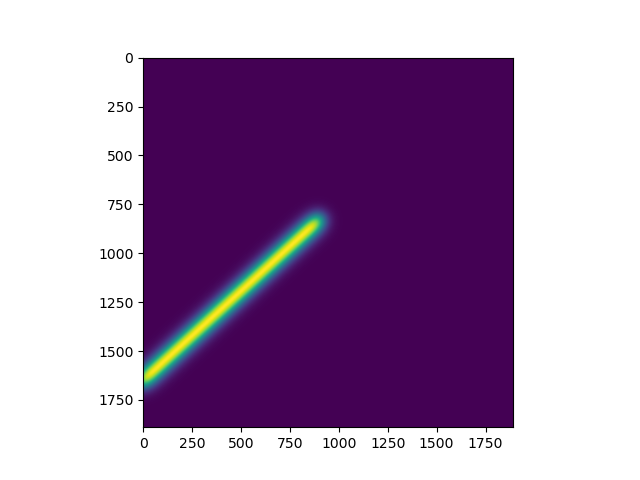

In [37]:
plt.figure()
plt.imshow(shift(psf.psf.longPSF,[300,-500]))

In [46]:
import time

start = time.time()
shift(large,[100,100])
end = time.time()
print(end - start)



2.31170392036438


In [50]:
data = psf.data
X=np.arange(data.shape[1]*10)/float(10)+0.5/10
Y=np.arange(data.shape[0]*10)/float(10)+0.5/10
large = np.zeros((3,len(Y),len(X)))
large[0,1000,1000] = 1
large[1,1000,1100] = 1
large[2,1000,1100] = 1

In [52]:
import time

start = time.time()
for i in range(len(large)):
    signal.fftconvolve(large[i],psf.psf.longPSF,mode='same')
end = time.time()
print(end - start)



3.6750290393829346


In [32]:
np.sum(shift(psf.psf.longPSF,[100,100]))

25567908.11199011

In [34]:
np.sum(psf.psf.longPSF)

25567908.186241113

In [2]:
import numpy as np
from joblib import Parallel, delayed
from scipy.optimize import least_squares
from skimage.util.shape import view_as_windows
from copy import deepcopy
from skimage.measure import block_reduce


def mag_flux_ratio(groupflux,sources,psf_scalers):
    keys = sources.keys()
    mag_key = []
    for key in keys:
        if 'mag' in key:
            mags = sources[key].values
            if np.isfinite(mags).all():
                mag_key += [key]
    ratios = []
    for key in mag_key:
        f = 10**(-2/5*(sources[key].values)) * psf_scalers
        tflux = np.sum(f)
        ratio = f*psf_scalers / tflux
        ratios += [ratio]
    ratios = np.array(ratios)
    ratios = np.nanmean(ratios,axis=0)
    fluxes = groupflux * ratios
    return fluxes

def rounder(x, base=1):
    return base * np.round(x/base)

class PSF_photom():

    def __init__(self,data,cat,psf_params,noise_floor=None):
        self.cat = cat.copy(deep=True)
        self._set_data(data,psf_params[2]/2)
        self._set_psf(psf_params)
        self._clip_cat()
        self._set_floor(noise_floor)

        #self._set_source_dims(source_dims)


    def _set_psf(self,psf_params):
        self.psf_params = psf_params
        if self.cube:
            x=self.data.shape[2];y=self.data.shape[1]
        else:
            x=self.data.shape[1];y=self.data.shape[0]

        self.psf = create_psf(x=x,y=y,alpha=psf_params[0],
                              beta=psf_params[1],length=psf_params[2],angle=psf_params[3])
        self.psf.line()

    def _set_data(self,data,pad):
        self.pad = int(pad)
        self.data = np.pad(deepcopy(data),self.pad,)
        self.data[self.data==0] = np.nan
        
        if len(data.shape) == 2:
            self.cube = False
            self.image = self.data
        else:
            self.cube = True
            self.data = self.data[self.pad:-self.pad]
            self.image = np.nanmedian(self.data,axis=0)
        self.cat['yint'] = self.cat['yint'].values + self.pad
        self.cat['xint'] = self.cat['xint'].values + self.pad
        self.cat['y'] = self.cat['y'].values + self.pad
        self.cat['x'] = self.cat['x'].values + self.pad
    
    def _set_floor(self,noise_floor):
        if noise_floor is None:
            noise_floor = 1
        self.noise_floor = noise_floor
        if self.cube:
            if len(self.noise_floor) != len(self.data):
                self.noise_floor = np.zeros(len(self.data)) + noise_floor
    
    def _clip_cat(self):
        cat = self.cat
        ind = (cat.xint.values >= 0) & (cat.xint.values < self.image.shape[1]) & (cat.yint.values >= 0) & (cat.yint.values < self.image.shape[1])
        self.cat = cat.iloc[ind]

        #self._make_masks()
        #f0 = self._estimate_f0(self.image,np.ones(len(self.cat)))
        #ind = np.isfinite(f0)
        #self.cat = self.cat.iloc[ind]
        #self._make_masks()

    def _set_source_dims(self,source_dims):
        try:
            length = len(source_dims)
            if length == 2:
                self.x_length = source_dims[0]
                self.y_length = source_dims[1]
            else:
                self.x_length = source_dims; self.y_length = source_dims
        except:
            self.x_length = source_dims; self.y_length = source_dims

    def _make_masks(self,limit=0.5):
        self._set_psf(self.psf_params)
        im = np.zeros((len(self.cat),self.image.shape[0],self.image.shape[1]))
        for i in range(len(self.cat)):
            im[i,self.cat.yint.values[i],self.cat.xint.values[i]] = 1
        kernel = (self.psf.longpsf > np.nanmax(self.psf.longpsf) * limit)*1#np.ones((2*self.y_length,2*self.x_length))
        im = signal.fftconvolve(im,kernel[np.newaxis,:,:],mode='same')
        m = im > 0.1
        self.source_masks = m
        self.psf_masks = im

    def group_sources(self,limit=0.5):
        im = np.zeros_like(self.image)
        im[self.cat.yint.values,self.cat.xint.values] = 1
        kernel = (self.psf.longpsf > np.nanmax(self.psf.longpsf)*limit)*1
        im = signal.fftconvolve(im,kernel,mode='same')

        im = im > 0.1
        labeled, nr_objects = label(im)
        self.cat['group'] = 0
        for i in range(len(self.cat)):
            self.cat['group'].iloc[i] = labeled[self.cat.yint.values[i],self.cat.xint.values[i]]


    def _groups_mask(self,ind):
        if np.sum(ind) > 1:
            mask = (np.nansum(self.source_masks[ind],axis=0) > 0) * 1.0
        else:
            mask = self.source_masks[ind] * 1.0
        mask[mask == 0] = np.nan

        return mask


    def _estimate_f0(self,data,ind):
        ind = np.where(ind)[0]
        m = np.zeros_like(data)
        psf = []#np.zeros_like(data)
        for i in ind:
            m += self.source_masks[i]
            psf += [self.psf_masks[i]]
        psf = np.array(psf)
        m[m>1] = 1
        base = np.nansum(m * data)
        finite = np.isfinite(data * m)
        psf_scalers = np.nansum(psf,axis=(1,2))/np.nansum(psf[:,finite],axis=(1))
        f0 = mag_flux_ratio(base,self.cat.iloc[ind],psf_scalers)
        #print('scaler: ',scaler)
        f0 = np.array(f0)
        return f0
    
    
    def make_psf_image_old(self,x0,data,sources):
        f0 = x0[:len(sources)]; px = x0[len(sources):len(sources)*2] ; py = x0[2*len(sources):]
        tripys = []
        centx = data.shape[1] / 2; centy = data.shape[0] / 2
        xs = px - centx
        ys = py - centy
        f = []
        t = create_psf(x=data.shape[1],y=data.shape[0],alpha=self.psf_params[0],
                       beta=self.psf_params[1],length=self.psf_params[2],angle=self.psf_params[3])
        for i in range(len(f0)):
            t.line(shiftx=xs[i],shifty=ys[i])
            f += [t.longpsf * f0[i]]
        f = np.array(f)
        f = np.nansum(f,axis=0)
        return f 

    def make_psf_image(self,flux,xpos,ypos):
        f0 = flux; px = xpos; py = ypos
        X=np.arange(self.image.shape[1]*10)/float(10)+0.5/10
        Y=np.arange(self.image.shape[0]*10)/float(10)+0.5/10
        large = np.zeros((len(Y),len(X)))

        for i in range(len(f0)):
            indx = np.argmin(abs(X-px[i]))
            indy = np.argmin(abs(Y-py[i]))
            large[indy,indx] = f0[i]
        k = psf.psf.longPSF / np.nansum(psf.psf.longPSF)
        large = signal.fftconvolve(large,k,mode='same')
        image = block_reduce(large,block_size=10)
        return image
        
    def make_psf_image_3(self,flux,xpos,ypos):
        large = np.zeros((self.image.shape[0]*10,self.image.shape[1]*10))
        xcent = self.image.shape[1] / 2; ycent = self.image.shape[0] / 2
        shifts = np.array([(ypos-ycent)*10,(xpos-xcent)*10]).T
        
        for i in range(len(flux)):
            tmp = shift(self.psf.longPSF,shifts[i]) * flux[i]
            large += tmp
        
        image = block_reduce(large,block_size=10)
        return image
    
    def _pos_minimizer(self,x0,data,flux):
        print('x0 ',x0)
        ndata = data / np.nanmax(data)
        x = x0[:len(flux)]; y = x0[len(flux):]
        im = self.make_psf_image(flux,x,y)
        im /= np.nanmax(im)
        res = np.nansum(abs(data - im))
        print('res ',res)
        return res
     
    def _flux_minimizer(self,f0,data,x,y):
        print('f0 ',f0)
        im = self.make_psf_image(f0,x,y)
        res = np.nansum(abs(data - im))
        print('f res ',res)
        return res
    
    def _group_minimizer(self,x0,data,sources,floor):
        print('x0 ',x0)
        f0 = 10**x0[:len(sources)]; px = x0[len(sources):len(sources)*2] ; py = x0[2*len(sources):]
        f = self.make_psf_image(f0,px,py)
        res = np.nansum(abs(data - f))
        #res = rounder(res,floor)
        print('res r ',res)
        return np.exp(res)
    
    
    def group_fit(self,data,ind,noise_floor):
        sources = self.cat.iloc[ind]
        mask = self._groups_mask(ind)
        f0 = self._estimate_f0(data,ind)
        f0[f0<=0] = 1
        f0 = np.log10(f0)
        pos0 = np.append(sources['xint'].values,sources['yint'].values,axis=0)
        guess = np.append(f0,pos0,axis=0)
        f0_bounds = np.array([f0*0,f0*2]).T
        pos_bounds = np.zeros((len(pos0),2))
        pos_bounds[:,0] = pos0-10; pos_bounds[:,1] = pos0+10
        bounds = np.append(f0_bounds,pos_bounds,axis=0).T
        data_masked = data * mask
        pos_data = self.image*mask
        pos_data /= np.nanmax(pos_data)
        #res = minimize(self._pos_minimizer,pos0,args=(pos_data,f0),method='Powell',tol=0.1)#,bounds=pos_bounds)
        #xp = res.x[:len(f0)]; yp = res.x[len(f0):]
        #res = minimize(self._flux_minimizer,f0,args=(data_masked,xp,yp),method='Nelder-Mead',tol=1,bounds=f0_bounds)
        #print('guess ',guess)p
        print(bounds)
        x_scale = np.zeros(bounds.shape[1])
        x_scale[:len(f0)] = 10 
        x_scale[len(f0):] = 1 * pos0
        res = least_squares(self._group_minimizer,guess,args=(data_masked,sources,noise_floor),method='trf',x_scale=x_scale)
        #res = minimize(self._group_minimizer, guess,args=(data_masked,sources,noise_floor), method = 'TNC', bounds=bounds, jac = '2-point', 
        #               options={'disp': True, 'finite_diff_rel_step': x_scale, 'xtol': 0.1, 'accuracy': 0.1})
        flux = res.x[:len(f0)]; xp = res.x[len(f0):len(f0)*2]; yp = res.x[len(f0)*2:len(f0)*3]

        res = data_masked - self.make_psf_image(flux,xp,yp)

        return flux, xp, yp, res



    def group_psf(self):
        groups = self.cat.group.unique()
        fluxes = {}
        residual = np.zeros_like(self.data)
        self.psf = create_psf(x=self.psf_params[2],y=self.psf_params[2],alpha=self.psf_params[0],
                       beta=self.psf_params[1],length=self.psf_params[2],angle=self.psf_params[3])
        self.psf.line()
        for group in groups:
            ind = self.cat.group.values == group

            if self.cube:
                flux, posx, posy, res = self.group_fit(self.data,ind,self.noise_floor)
                index = np.arange(0,len(self.data))
                f, xp, yp, res = zip(*Parallel(n_jobs=num_cores)(delayed(self.group_fit)(self.data[i],ind,self.noise_floor[i]) for i in index))
                flux = np.array(f).T; posx = np.array(xp); posy = np.array(yp); res = np.array(res)
                posx = np.nanmean(posx,axis=0); posy = np.nanmean(posy,axis=0)

            else:
                flux, posx, posy, res = self.group_fit(self.data,ind,self.noise_floor)

            self.cat['x'].iloc[ind] = posx; self.cat['y'].iloc[ind] = posy
            sources = self.cat.iloc[ind]
            for i in range(len(sources)):
                fluxes[sources.id.iloc[i]] = flux[i]
        
        self.fit_image = self.make_psf_image_2()
        self.fluxes = fluxes 
        self.residual = residual

In [5]:
bleh = deepcopy(test.psf_param)
#bleh[0]= 8.13120344
psf = PSF_photom(test.image,test.cat,bleh,noise_floor=test.bkgstd[1000]*0+.1)
psf._make_masks()
psf.group_sources()
#psf.group_psf()



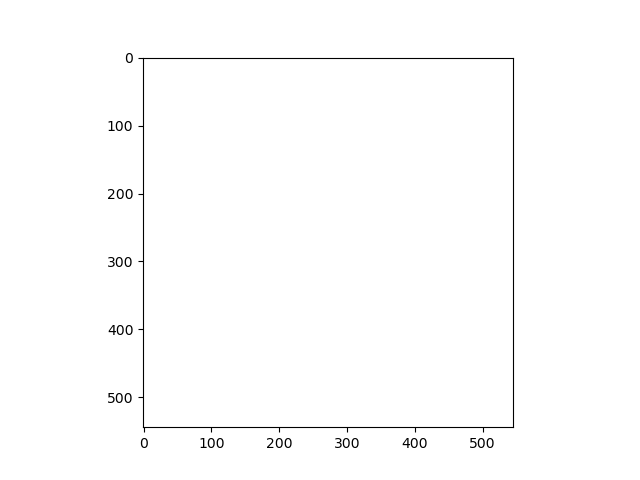

In [6]:
plt.figure()
plt.imshow(psf.psf.longpsf)

In [544]:
ind = psf.cat.group.values == 3

In [545]:
data = psf.data
sources = psf.cat.iloc[ind]
mask = psf._groups_mask(ind)
mask[mask<1] = np.nan
f0 = psf._estimate_f0(data,ind)
f0[f0<=0] = 1
f0 = np.log10(f0)
pos0 = np.append(sources['xint'].values,sources['yint'].values,axis=0)
guess = np.append(f0,pos0,axis=0)
f0_bounds = np.array([f0*0,f0*2]).T
pos_bounds = np.zeros((len(pos0),2))
pos_bounds[:,0] = pos0-10; pos_bounds[:,1] = pos0+10
bounds = np.append(f0_bounds,pos_bounds,axis=0).T
data_masked = data * mask
pos_data = psf.image*mask
pos_data /= np.nanmax(pos_data)
#res = minimize(psf._pos_minimizer,pos0,args=(pos_data,f0),method='Powell',tol=0.1)#,bounds=pos_bounds)
#xp = res.x[:len(f0)]; yp = res.x[len(f0):]
#res = minimize(psf._flux_minimizer,f0,args=(data_masked,xp,yp),method='Nelder-Mead',tol=1,bounds=f0_bounds)
#print('guess ',guess)p
print(bounds)
x_scale = np.zeros(bounds.shape[1])
x_scale[:len(f0)] = 10 
x_scale[len(f0):] = 1 * pos0

[[  0.        380.        121.       ]
 [  6.2622724 400.        141.       ]]


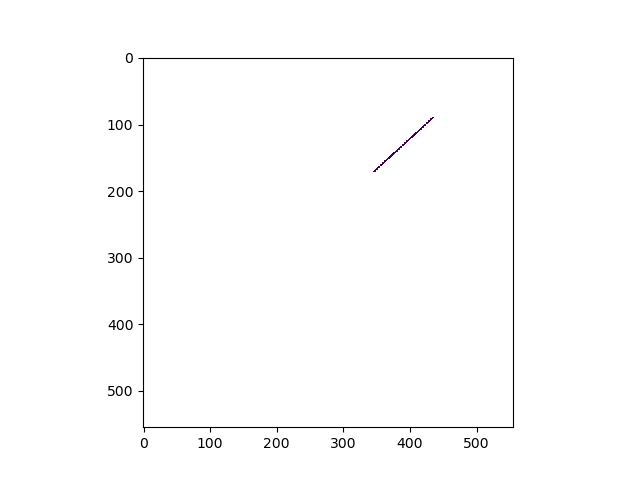

In [547]:
plt.figure()
plt.imshow(mask[0])

In [548]:
sources

,_q,ra,dec,id,e_RA_ICRS,e_DE_ICRS,Plx,e_Plx,PM,pmRA,...,RAVE6,RAJ2000,DEJ2000,G_filt,x,y,xint,yint,cal_source,group
5,1,103.363751,-6.030375,3101044556119920384,0.3388,0.3607,0.1911,0.4306,2.324,2.182,...,,103.363741,-6.030371,GAIA/GAIA3.G,390.286146,130.731211,390,131,0,3


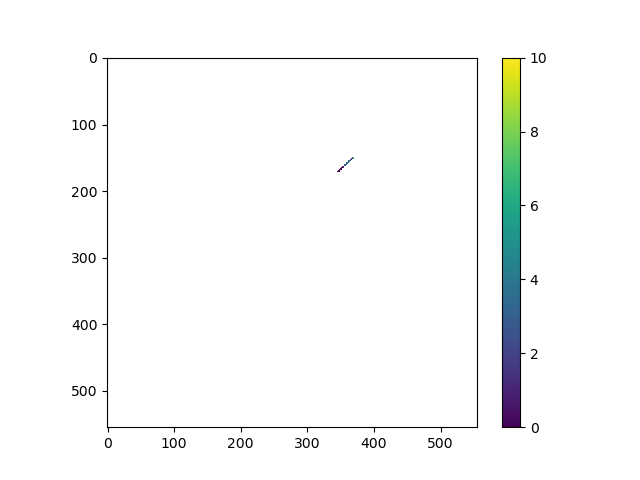

In [550]:
im = psf.make_psf_image(10**f0,sources['xint'].values,sources['yint'].values+1)
plt.figure()
plt.imshow(mask[0]*(data),vmin=0,vmax=10)# / psf.noise_floor)
#plt.ylim(350,410)
#plt.xlim(180,240)
plt.colorbar()

In [483]:
np.nansum(m*(data - im*1.2))

37363.85068188248

In [415]:
np.nansum(m*(data - im))

117136.18090641785

In [266]:

f0 = mag_flux_ratio(f0,psf.cat.iloc[ind])
#print('scaler: ',scaler)
f0 = np.array(f0)

In [272]:
np.sum(f0)

1218264.0000000002

In [273]:
np.sum(im)

1218263.9999999988

In [271]:
np.nansum(psf.psf.longPSF)

25567908.169859454

(array([ 6.,  6.,  6., 23., 46., 46., 54., 78., 48., 12.]),
 array([ 210.94299316,  380.15362549,  549.36425781,  718.57489014,
         887.78552246, 1056.99615479, 1226.20678711, 1395.41741943,
        1564.62805176, 1733.83868408, 1903.04931641]),
 <BarContainer object of 10 artists>)

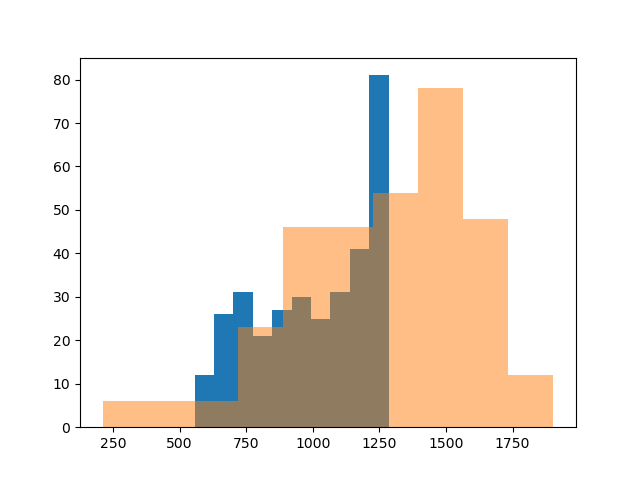

In [485]:
i = im > 1
ii = data_masked > 1
plt.figure()
plt.hist(im[ii])
plt.hist(data_masked[ii],alpha=0.5)


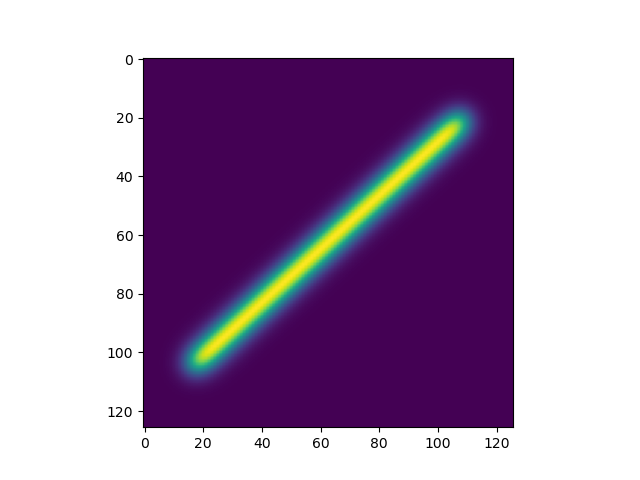

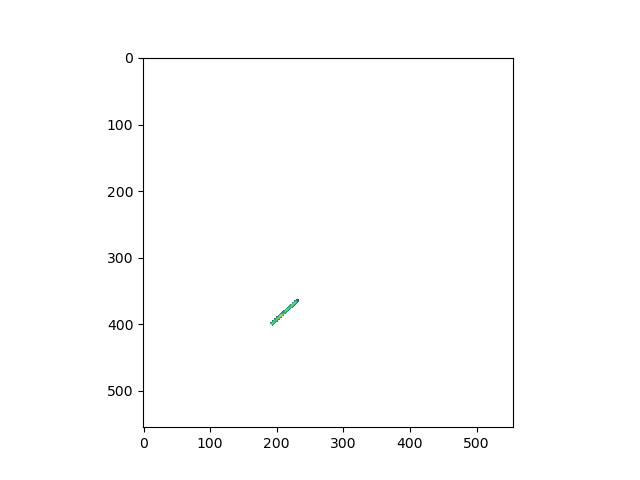

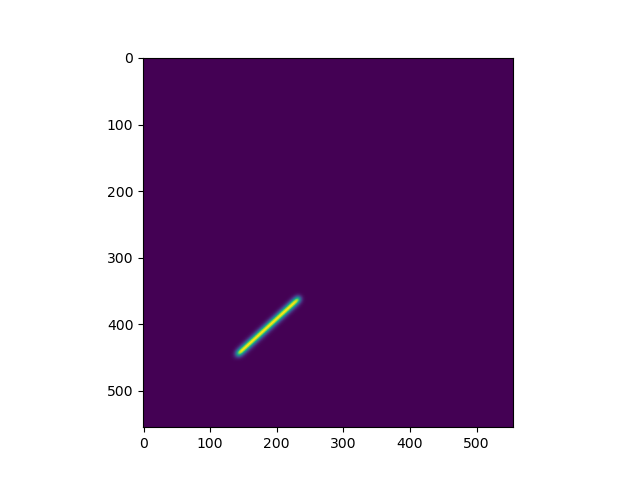

In [242]:
plt.figure()
plt.imshow(psf.psf.longpsf)
plt.figure()
plt.imshow(data_masked)
plt.figure()
plt.imshow(im)

In [464]:
bleh = deepcopy(test.psf_param)
bleh[0]= 8.13120344
psf = PSF_photom(test.cube[1000],test.cat,bleh,noise_floor=test.bkgstd[1000])
psf._make_masks()
psf.group_sources()
#psf.group_psf()



In [207]:
4 * .1

0.4

In [208]:
4/0.9

4.444444444444445

In [195]:
def func(a):
    print(a)
    return (a - np.log10(5e4))**2

In [201]:
least_squares(func,1e5,f_scale=1e2)

[100000.]
[100000.00149012]
[50002.34985]
[50002.3505951]
[25003.5247005]
[25003.52507308]
[12504.11192367]
[12504.11210999]
[6254.40549731]
[6254.4055905]
[3129.55225463]
[3129.55230127]
[1567.1256238]
[1567.12564715]
[785.91230574]
[785.91231745]
[395.30564052]
[395.30564641]
[200.00230672]
[200.0023097]
[102.35063889]
[102.35064041]
[53.5248048]
[53.5248056]
[29.11188753]
[29.11188796]
[16.90542891]
[16.90542916]
[10.80219954]
[10.8021997]
[7.75058481]
[7.75058492]
[6.22477743]
[6.22477753]
[5.46187374]
[5.46187382]
[5.08042189]
[5.08042197]
[4.88969597]
[4.88969604]
[4.794333]
[4.79433308]
[4.74665152]
[4.74665159]
[4.72281078]
[4.72281085]
[4.71089041]
[4.71089048]
[4.70493022]
[4.70493029]
[4.70195013]
[4.7019502]
[4.70046009]
[4.70046016]


     message: `gtol` termination condition is satisfied.
     success: True
      status: 1
         fun: [ 2.220e-06]
           x: [ 4.700e+00]
        cost: 2.464960603870357e-12
         jac: [[ 2.980e-03]]
        grad: [ 6.617e-09]
  optimality: 6.617137915571274e-09
 active_mask: [ 0.000e+00]
        nfev: 27
        njev: 27

In [197]:
np.log10(5e4)

4.698970004336019

In [ ]:
[1.19500158e+06 2.32624403e+04 1.87864700e+02 1.81353003e+02
 4.03968223e+02 4.10373571e+02]

In [101]:
ind = psf.cat.group.values == 17 
sources = psf.cat.iloc[ind]
mask = psf._groups_mask(ind)
f0 = psf._estimate_f0(data,ind)
f0[f0<=0] = 1
pos0 = np.append(sources['xint'].values,sources['yint'].values,axis=0)
guess = np.append(f0,pos0,axis=0)
f0_bounds = np.array([f0*0,f0*10]).T
pos_bounds = np.zeros((len(pos0),2))
pos_bounds[:,0] = pos0-10; pos_bounds[:,1] = pos0+10
bounds = np.append(f0_bounds,pos_bounds,axis=0)
data_masked = data * mask

In [114]:
m = psf.data * mask
#m /= np.nanmax(m)

In [115]:
np.nansum(m)

533286.8187866211

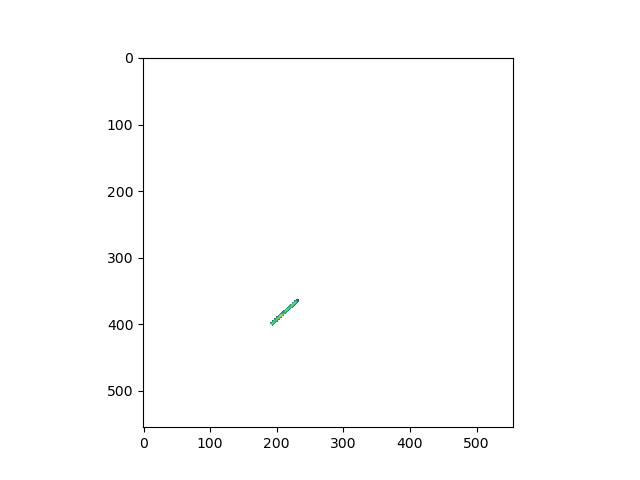

In [113]:
plt.figure()
plt.imshow(psf.data * mask)

In [22]:
round()

11990

In [65]:
im = np.zeros((len(test.cat),test.image.shape[0],test.image.shape[1]))
for i in range(len(test.cat)):
    im[i,test.cat.yint.values[i],test.cat.xint.values[i]] = 1
kernel = (test.psf.longpsf > np.percentile(test.psf.longpsf,85))*1#np.ones((2*test.y_length,2*test.x_length))
im = signal.fftconvolve(im,kernel[np.newaxis,:,:],mode='same')
im = im > 0.1

eh = np.nansum(im,axis=0) >0


In [80]:
nr_objects

11

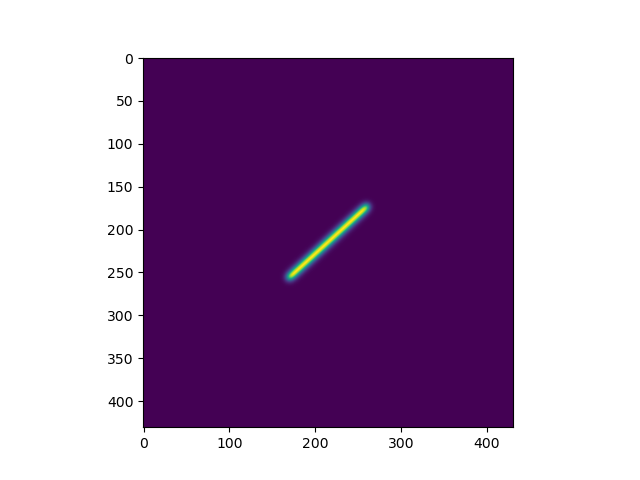

In [38]:
plt.figure()
plt.imshow(psf.psf.longpsf)

In [51]:
im = np.zeros_like(test.image)
im[test.cat.yint.values,test.cat.xint.values] = 1
kernel = (test.psf.longpsf > np.nanmax(test.psf.longpsf) * 0.1)*1#np.ones((2*test.y_length,2*test.x_length))
im = signal.fftconvolve(im,kernel,mode='same')

im = im > 0.1
labeled, nr_objects = label(im)
test.cat['group'] = 0
for i in range(len(test.cat)):
    test.cat['group'].iloc[i] = labeled[test.cat.yint.values[i],test.cat.xint.values[i]]
    
    

In [52]:
test.cat['group'].unique()

array([ 4,  9,  3,  7,  6,  2,  1,  5, 11, 10,  8])

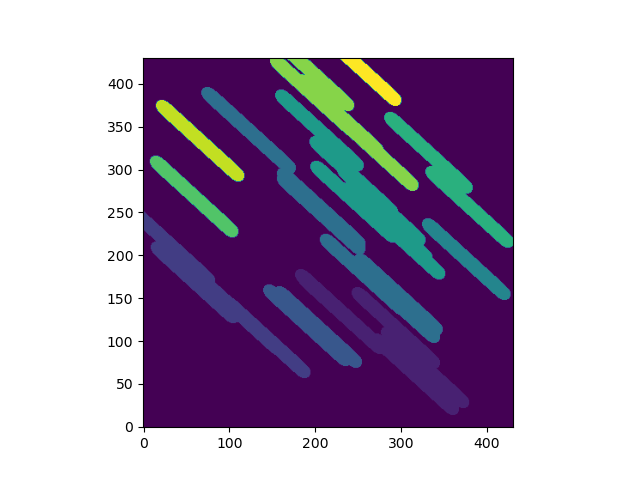

In [53]:
plt.figure()
plt.imshow(labeled,origin='lower')

In [ ]:
sources = np.arange(0,len(im))
group = 0
groups = []
while (len(sources) > 0) & (groups < len(im)):
    
    

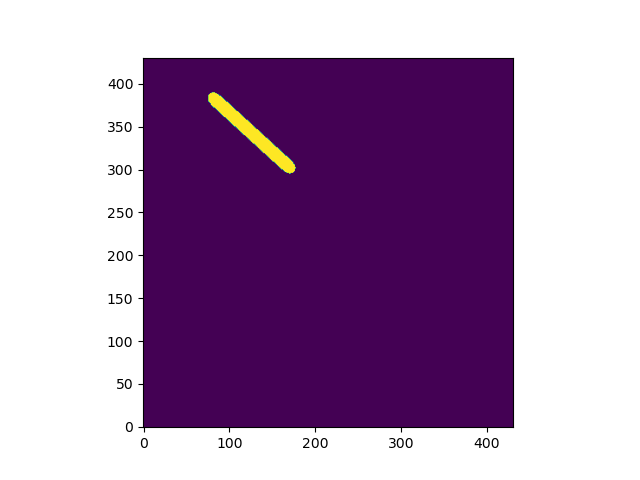

In [64]:
plt.figure()
plt.imshow(im[0],origin='lower')

In [55]:
im = np.zeros_like((len(cat),test.image))
im[test.cat.yint.values,test.cat.xint.values] = 1
kernel = (test.psf.longpsf > np.percentile(test.psf.longpsf,85))*1#np.ones((2*test.y_length,2*test.x_length))
im = signal.fftconvolve(im,kernel,mode='same')

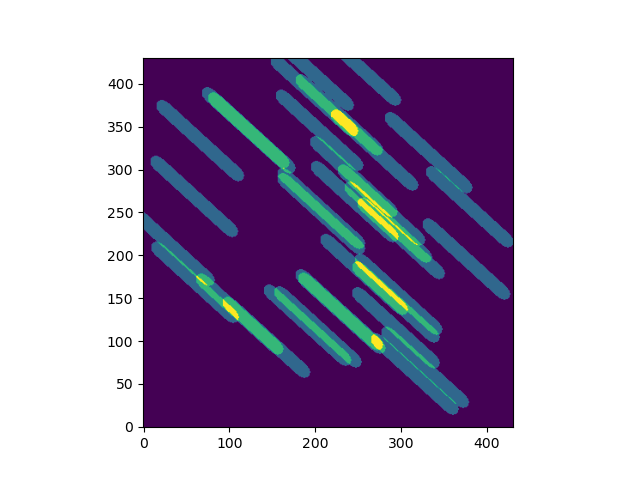

In [57]:
plt.figure()
plt.imshow(im,origin='lower')

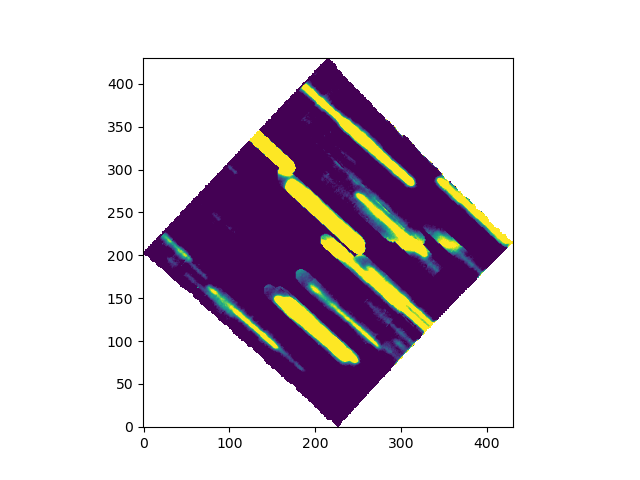

In [56]:
plt.figure()
plt.imshow((im>.1) * test.image,origin='lower',vmax=10,vmin=0)

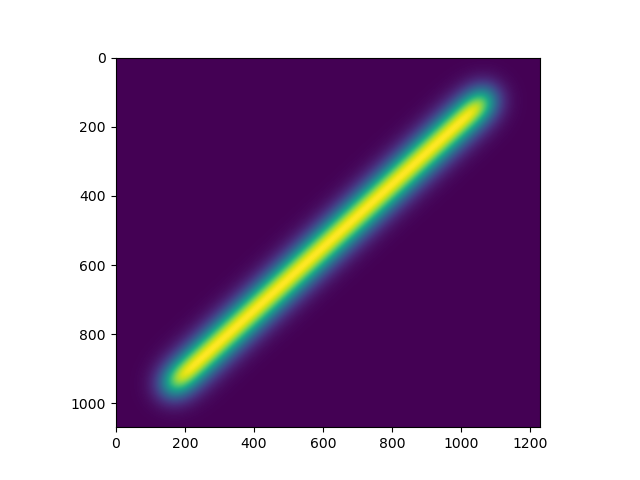

In [19]:
plt.figure()
plt.imshow(test.psf.longPSF)

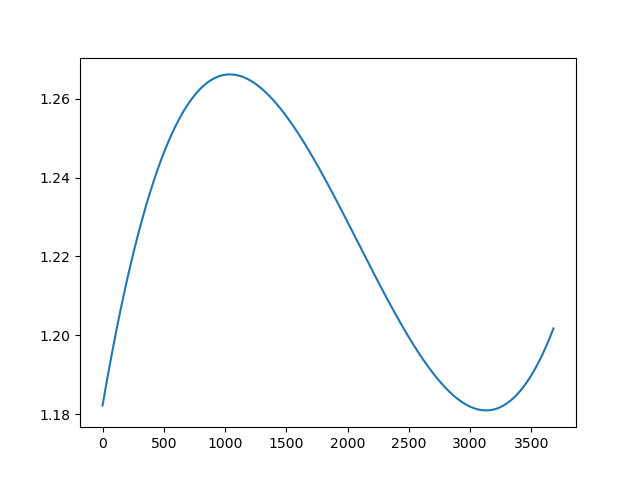

In [7]:
plt.figure()
plt.plot(test.flux_corr)

In [16]:
tel = at.Table.read('../cuber/data/telluric_lines.dat', format='ascii')

In [17]:
tel.keys()

['lam_min', 'lam_max', 'lam_c']

In [ ]:
plt.figure()
plt.

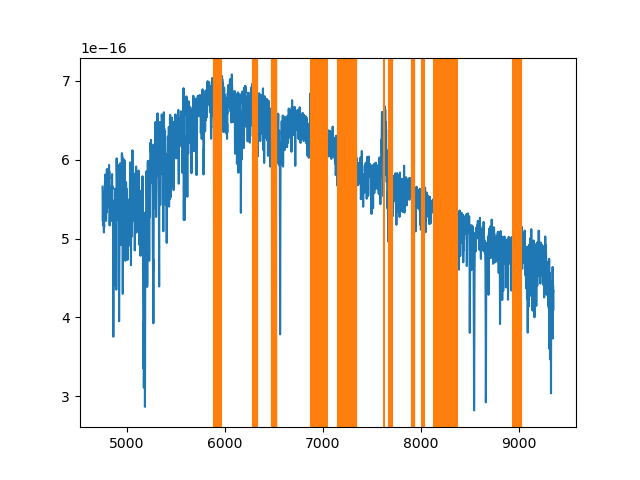

In [22]:
spec = test.specs[0]
plt.figure()
plt.plot(spec.wave,spec.flux)
for row in tel:
    plt.axvline(row['lam_c'],c='C1')

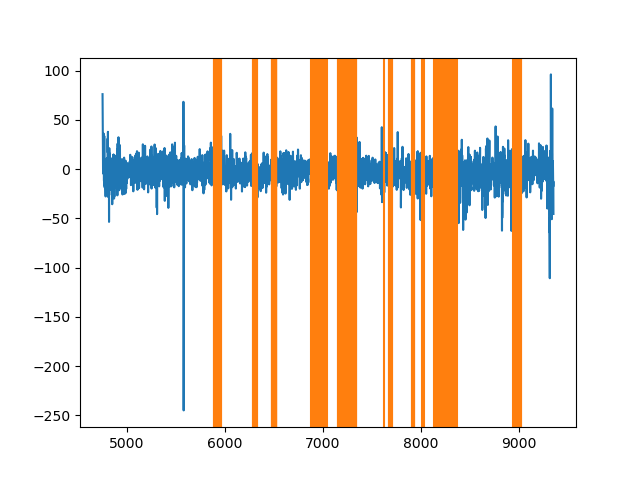

In [25]:
spec = test.cube[:,93,64]#.specs[0]
plt.figure()
plt.plot(test.lam,spec)
for row in tel:
    plt.axvline(row['lam_c'],c='C1')

In [47]:
from scipy.ndimage import shift

In [ ]:

def _match_by_shift(self):
    labeled, nr_objects = label(self.bright_mask > 0) 
    obj_size = []
    for i in range(nr_objects):
        obj_size += [np.sum(labeled==i)]
    obj_size = np.array(obj_size)
    targs = np.where((obj_size > 100) & (obj_size<1e4))[0]
    ims = []
    for i in range(len(targs)):
        ims += [(labeled == targs[i])*1.0]
    ims = np.array(ims)
    ind = ~sigma_clip(np.sum(ims,axis=(1,2)),sigma=2).mask
    
    ix = test.cube.shape[2] /2
    iy = test.cube.shape[1] /2
    cims = deepcopy(ims[ind])
    for i in range(len(cims)):
        ty,tx = np.where(cims[i] > 0)
        my = np.nanmedian(ty)
        mx = np.nanmedian(tx)
        sx = ix - mx; sy = iy - my
        cims[i] = shift(cims[i],[sy,sx])
    im = (np.nansum(ims,axis=0) > 0) * 1.

    s = (np.nanmedian(sims,axis=0) > 0.5) * 1.
    ty,tx = np.where(s > 0)
    s = s[min(ty)-3:max(ty)+4,min(tx)-3:max(tx)+4]
    
    x, y, _ = self.wcs.all_world2pix(self.cat.ra.values,self.cat.dec.values,0,0)
    # brute force it
    X,Y = np.meshgrid(np.arange(-100,100,10),np.arange(-100,100,10))
    positions = np.vstack([X.ravel(), Y.ravel(),X.ravel()*0]).T
    res = []
    for p in positions:
        guess = basic_image(p,x,y,im,s)
        res += [np.nansum(im - guess)]
    res = np.array(res)

    ind = np.argmin(res)

    x0 = positions[ind]
    bounds = [[x0[0]-10,x0[0]+10],[x0[1]-10,x0[1]+10],[0,np.pi/2]]
    res2 = minimize(minimize_cats,x0,args=(x,y,im,s),method='Nelder-Mead',bounds=bounds)
    self.wcs_shift = res2.x


    
    

In [105]:
labeled, nr_objects = label(test.bright_mask > 0) 
obj_size = []
for i in range(nr_objects):
    obj_size += [np.sum(labeled==i)]
obj_size = np.array(obj_size)
targs = np.where((obj_size > 100) & (obj_size<1e4))[0]
ims = []
for i in range(len(targs)):
    ims += [(labeled == targs[i])*1.0]
ims = np.array(ims)
ind = ~sigma_clip(np.sum(ims,axis=(1,2)),sigma=2).mask


ix = test.cube.shape[2] /2
iy = test.cube.shape[1] /2
cims = deepcopy(ims[ind])
sims = deepcopy(ims[ind])
for i in range(len(cims)):
    ty,tx = np.where(cims[i] > 0)
    my = np.nanmedian(ty)
    mx = np.nanmedian(tx)
    sx = ix - mx; sy = iy - my
    sims[i] = shift(cims[i],[sy,sx])
im = (np.nansum(ims,axis=0) > 0) * 1.
    
s = (np.nanmedian(sims,axis=0) > 0.5) * 1.
ty,tx = np.where(s > 0)
s = s[min(ty)-3:max(ty)+4,min(tx)-3:max(tx)+4]

In [115]:
x, y, _ = test.wcs.all_world2pix(test.cat.ra.values[,test.cat.dec.values[:10],0,0)
x += 0.5; y += 0.5

In [236]:
def basic_image(offset,x,y,image,kernel):
    cx = image.shape[1]/2; cy = image.shape[0]/2
    x = x + offset[0]
    y = y + offset[1]
    x = cx + ((x-cx)*np.cos(offset[2])-(y-cy)*np.sin(offset[2]))
    y = cy + ((x-cx)*np.sin(offset[2])+(y-cy)*np.cos(offset[2]))
    cut = (0<=x) & (x < image.shape[1]) & (0<=y) & (y < image.shape[0])
    x = x[cut]; y = y[cut]
    guess = np.zeros_like(image)
    guess[y.astype(int),x.astype(int)] = 1
    guess = (signal.fftconvolve(guess,kernel,mode='same') > 0.1) * 1.0
    return guess

def minimize_cats(offset,x,y,image,kernel):
    guess = make_guess(offset,x,y,image,kernel)
    res = np.nansum(image - guess)
    return res


In [237]:
x, y, _ = test.wcs.all_world2pix(test.cat.ra.values,test.cat.dec.values,0,0)
# brute force it
X,Y = np.meshgrid(np.arange(-100,100,10),np.arange(-100,100,10))
positions = np.vstack([X.ravel(), Y.ravel(),X.ravel()*0]).T
res = []
for p in positions:
    guess = make_guess(p,x,y,im,s)
    res += [np.nansum(im - guess)]
res = np.array(res)

ind = np.argmin(res)

x0 = positions[ind]
bounds = [[x0[0]-10,x0[0]+10],[x0[1]-10,x0[1]+10],[0,np.pi/2]]
res2 = minimize(minimize_cats,x0,args=(x,y,im,s),method='Nelder-Mead',bounds=bounds)



In [232]:
res2.x

array([ 2.62897334e+01, -3.71624903e+00,  2.77448404e-04])

In [209]:
ind = np.argmin(res)

In [210]:
ind

193

In [211]:
positions[ind]

array([ 30, -10,   0])

In [198]:
np.nansum(im - make_guess([26,-4,0],x,y,im,s))

2254.0

In [199]:
res[ind]

4594.0

In [194]:
np.where((positions[:,0] == 26) & (positions[:,1] == -4))

(array([4676]),)

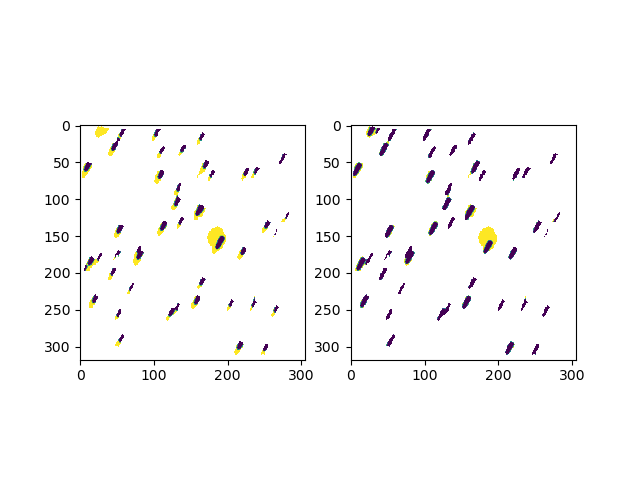

In [233]:
plt.figure()
plt.subplot(121)
plt.imshow(im - make_guess(positions[ind],x,y,im,s))
plt.subplot(122)
plt.imshow(im - make_guess(res2.x,x,y,im,s))

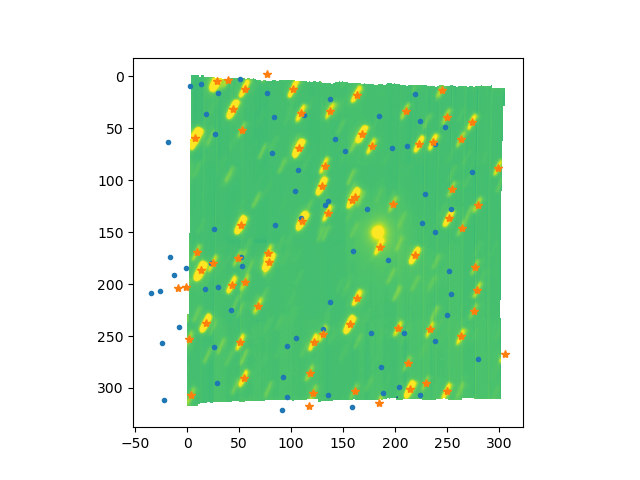

In [235]:
plt.figure()

plt.imshow(test.image,vmax=50)
plt.plot(x,y,'C0.')
plt.plot(x+res2.x[0]-.5,y+res2.x[1]-.5,'C1*')

In [183]:
test.wcs_shift

array([26.02835238, -3.83341743,  0.        ])

In [218]:
res2.x

array([ 2.58933013e+01, -3.35646237e+00,  2.63083561e-03])

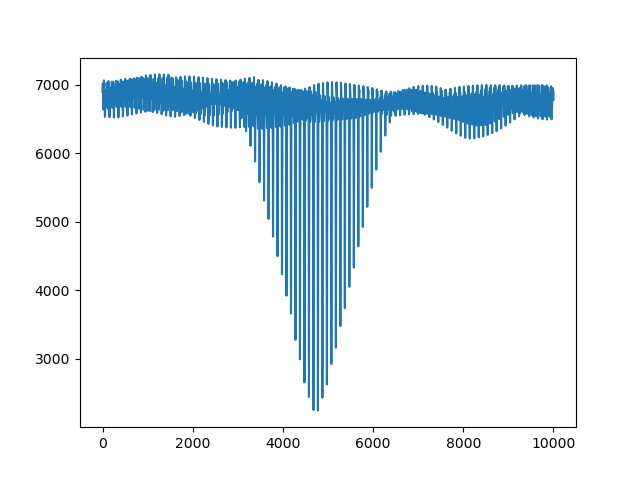

In [207]:
plt.figure()
plt.plot(res)

In [139]:
import emcee

pos = np.array([0,0,0]) * np.random.randn(32, 3)
nwalkers, ndim = pos.shape

sampler = emcee.EnsembleSampler(
    nwalkers, ndim, log_probability, args=(x, y, im,s)
)
sampler.run_mcmc(pos, 5000, progress=True);


ValueError: Initial state has a large condition number. Make sure that your walkers are linearly independent for the best performance

In [117]:
im[im==0] = np.nan


guess = np.zeros_like(im)
guess[y[cut].astype(int),x[cut].astype(int)] = 1
guess = (signal.fftconvolve(guess,s,mode='same') >0.1) * 1.0


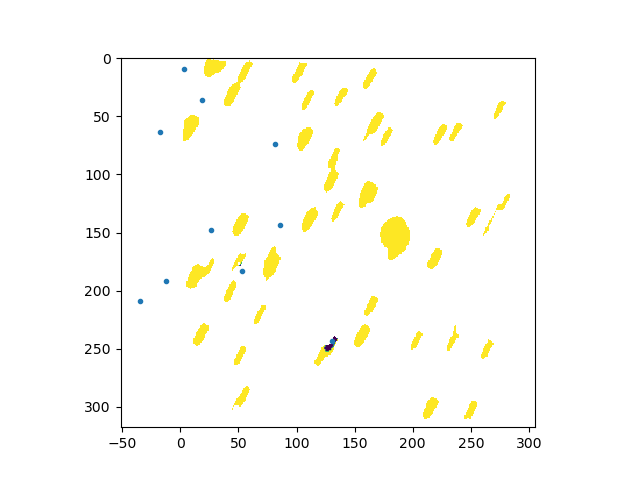

In [120]:
plt.figure()
plt.imshow(im-guess)
plt.plot(x,y,'.')

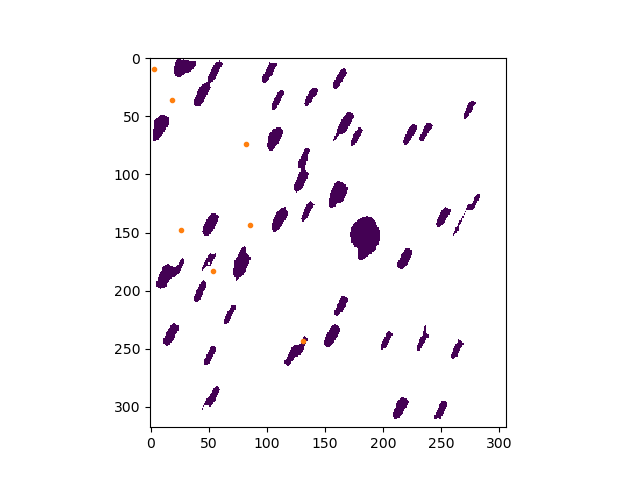

In [119]:
plt.figure()
plt.imshow(im)
plt.plot(x[cut],y[cut],'C1.')

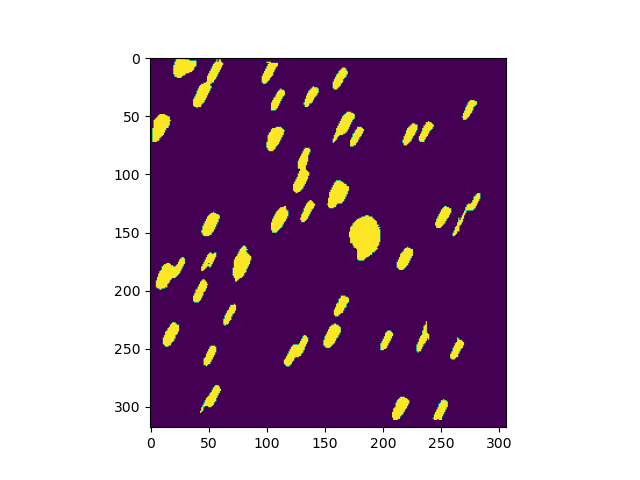

In [66]:
plt.figure()
plt.imshow(im)

(array([1., 0., 1., 1., 0., 0., 2., 0., 1., 1.]),
 array([113. , 114.1, 115.2, 116.3, 117.4, 118.5, 119.6, 120.7, 121.8,
        122.9, 124. ]),
 <BarContainer object of 10 artists>)

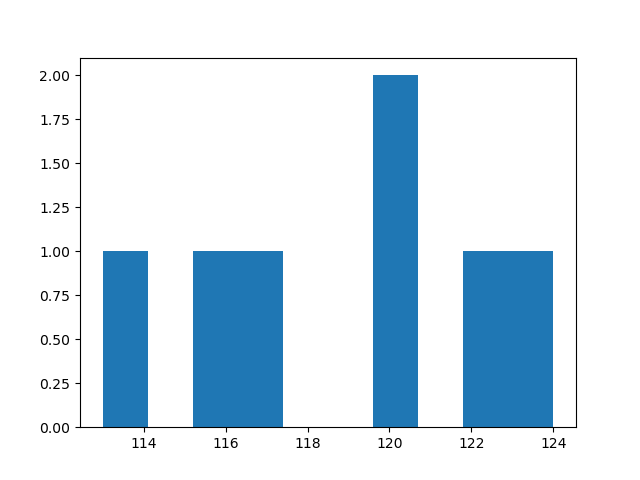

In [44]:
plt.figure()
plt.hist(np.sum(ims[ind],axis=(1,2)))

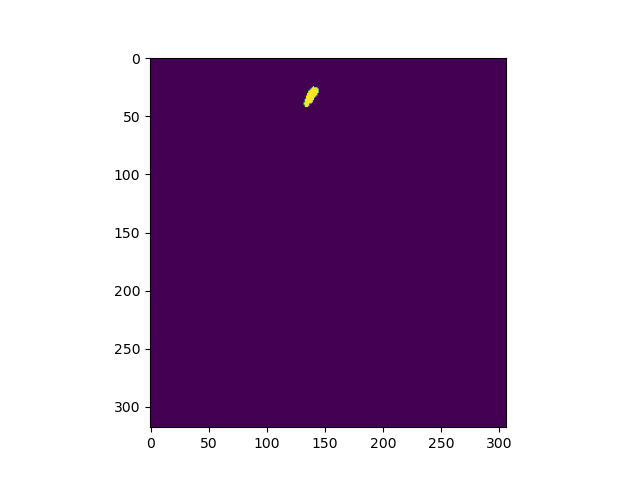

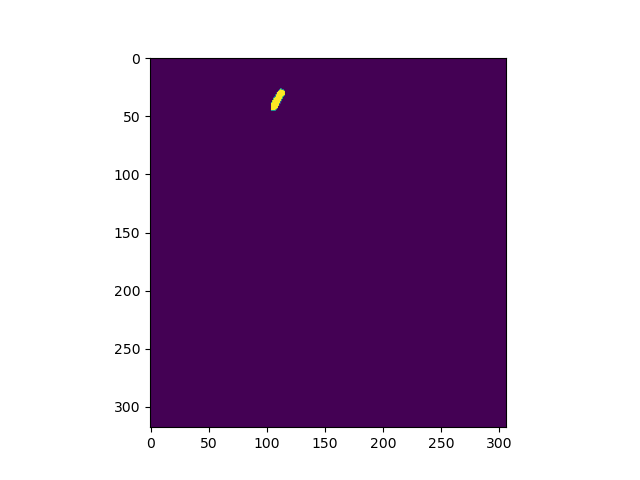

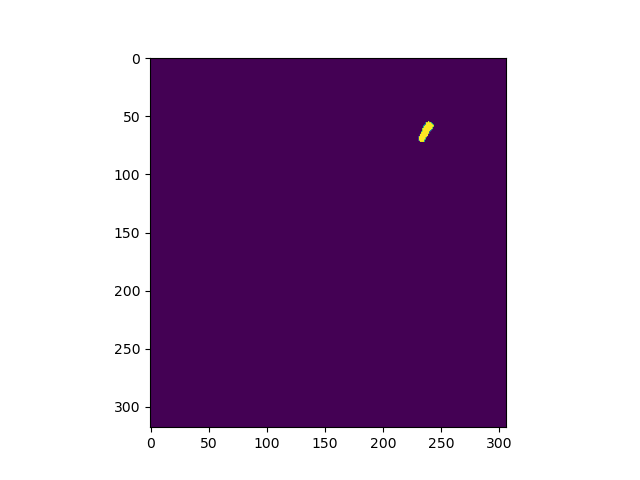

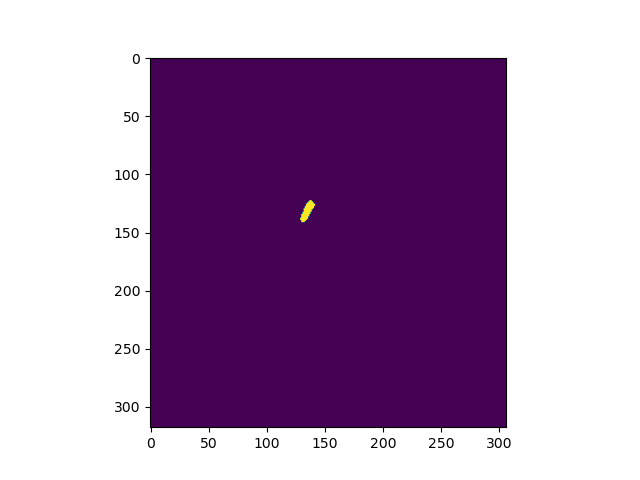

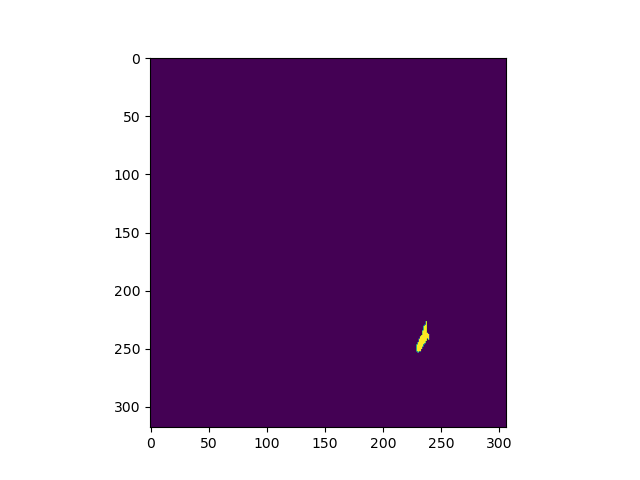

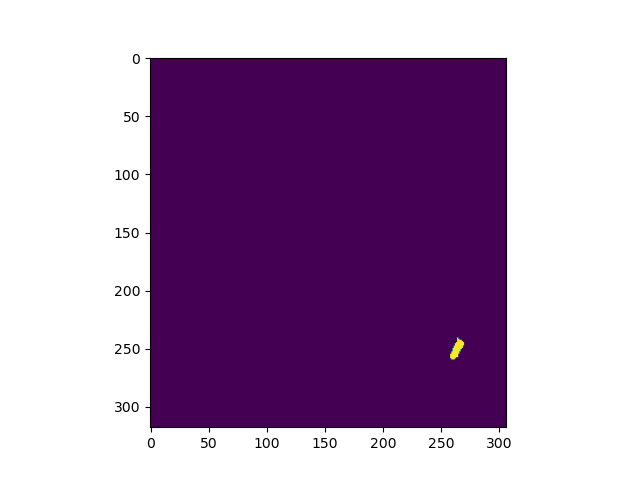

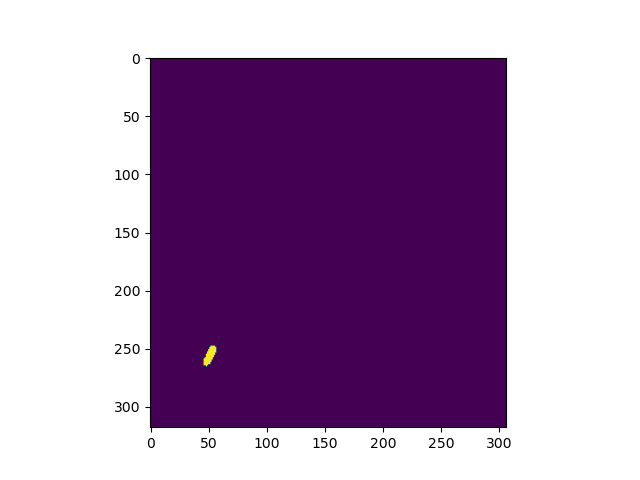

In [45]:
for i in range(len(ims[ind])):
    plt.figure()
    plt.imshow(ims[ind][i])

In [28]:
targs

array([  2,   4,   8,  16,  20,  21,  24,  27,  28,  30,  32,  34,  35,
        37,  44,  47,  48,  49,  50,  51,  52,  61,  62,  65,  67,  77,
        82,  84,  93,  95,  96,  99, 102, 103, 105, 114, 116, 117])

In [3]:
test.cat

,_q,ra,dec,Source,e_RA_ICRS,e_DE_ICRS,Plx,e_Plx,PM,pmRA,...,RAJ2000,DEJ2000,G_filt,x,y,xint,yint,cal_source,x_offset,y_offset
118,1,192.893161,-69.140111,5856950561179332352,0.0412,0.0437,0.7897,0.0511,8.355,-7.396,...,192.893253,-69.140128,GAIA/GAIA3.G,6.985919,60.057589,8,60,1,-1.014081,0.057589
8,1,192.889926,-69.143134,5856949805265086464,0.0459,0.0501,0.3430,0.0584,6.343,-6.320,...,192.890005,-69.143131,GAIA/GAIA3.G,27.361638,5.782379,29,5,1,-1.638362,0.782379
121,1,192.892345,-69.133027,5856950561179337216,0.0623,0.0632,1.3990,0.0759,23.049,-6.730,...,192.892429,-69.133125,GAIA/GAIA3.G,12.288462,187.556203,13,187,1,-0.711538,0.556203
120,1,192.882090,-69.133489,5856950561179336704,0.0626,0.0646,0.2351,0.0778,3.515,-3.330,...,192.882132,-69.133494,GAIA/GAIA3.G,77.720416,178.905178,79,179,0,-1.279584,-0.094822
119,1,192.886307,-69.135445,5856950561179334912,0.0762,0.0746,0.2647,0.0922,7.993,-7.885,...,192.886405,-69.135439,GAIA/GAIA3.G,50.944187,143.352646,52,144,1,-1.055813,-0.647354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,1,192.886099,-69.140531,5856950561150900864,2.4202,4.1014,NaN,NaN,NaN,NaN,...,192.886099,-69.140531,GAIA/GAIA3.G,52.000191,52.613124,53,52,1,-0.999809,0.613124
75,1,192.851292,-69.130874,5856950251913256192,1.4953,2.1878,NaN,NaN,NaN,NaN,...,192.851292,-69.130874,GAIA/GAIA3.G,275.531777,225.673971,276,226,1,-0.468223,-0.326029
71,1,192.853099,-69.135286,5856950251912092416,1.9333,1.6722,NaN,NaN,NaN,NaN,...,192.853099,-69.135286,GAIA/GAIA3.G,264.203680,144.937536,265,146,1,-0.796320,-1.062464
74,1,192.858541,-69.127008,5856950251913255808,1.6520,1.3603,NaN,NaN,NaN,NaN,...,192.858541,-69.127008,GAIA/GAIA3.G,228.181439,296.375962,230,295,1,-1.818561,1.375962


In [103]:
mask = test.scene.all_psfs > np.percentile(test.scene.all_psfs,85)
mask[mask == 0] = np.nan

In [104]:
scale_cube = cube_simulator(test.cube,test.psf,test.cat)
thingo = []
for i in range(len(test.cors)):
    thingo += [np.ones((len(test.cube))) *test.cors[i]]
scale_cube.make_scene(thingo)

In [105]:
scaller = scale_cube.sim/np.nanmax(scale_cube.sim)

In [57]:
weights

array([0.99350597, 0.89514069, 0.51089493, 0.34236734, 0.3837413 ,
       0.35920364, 0.47580514, 0.34452523, 0.14012818, 0.34221515,
       0.15130333, 0.3370525 , 0.08718925, 0.08251813, 0.15120445,
       0.32496863, 0.39541789, 0.2640621 , 0.14007635, 0.75546384,
       0.40172521, 0.15809573, 0.24263971, 0.12286383])

In [70]:
weights = test.cors
scale_cube.weights = np.zeros_like(test.cube)
for i in range(len(weights)):
    seed = scale_cube.seeds[i]
    seed = (seed > np.percentile(seed,99)) * 1.0
    scale_cube.weights += seed[np.newaxis,:,:] * weights[i]

In [78]:
def correction(x, model,data,correlation):
    return np.nansum(abs(data - model*x) * correlation)

cor = []
bds = [[1e-2,1e2]]
for i in range(len(test.cube)):
    res = minimize(correction,1,args=(test.scene.sim[i],test.cube[i]*mask,scale_cube.weights[i]))#,bounds=bds)
    cor += [res.x]

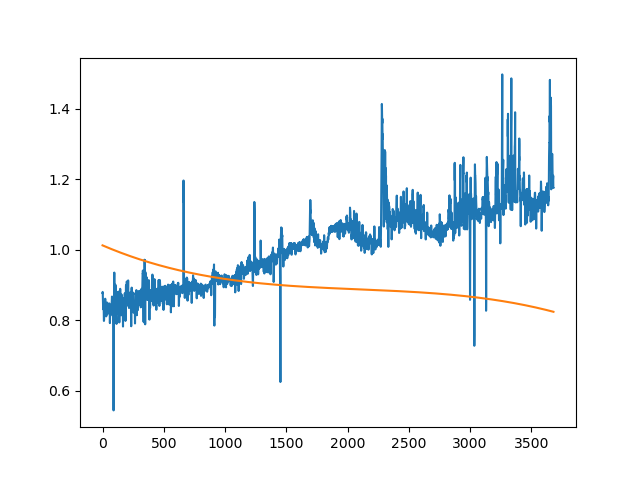

In [83]:
plt.figure()
plt.plot(cor)
plt.plot(test.flux_corr)

In [ ]:
plt.figure()
plt.subplot(121)
plt.imshow((test.cube[100]-test.scene.sim[100]*cor[100]),vmin=-10,vmax=50)

plt.subplot(122)
plt.imshow((test.cube[100]-test.scene.sim[100]*cor[100]),vmin=-10,vmax=50)

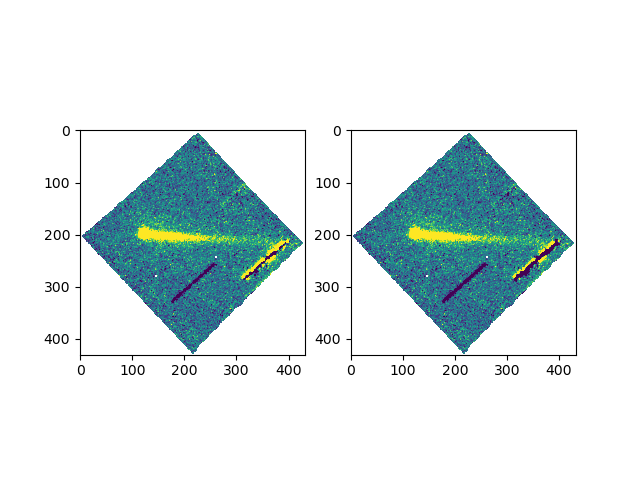

In [94]:
i = 500
plt.figure()
plt.subplot(121)
plt.imshow((test.cube[i]-test.scene.sim[i]*cor[i]),vmin=-10,vmax=50)

plt.subplot(122)
plt.imshow((test.cube[i]-test.scene.sim[i]),vmin=-10,vmax=50)



array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

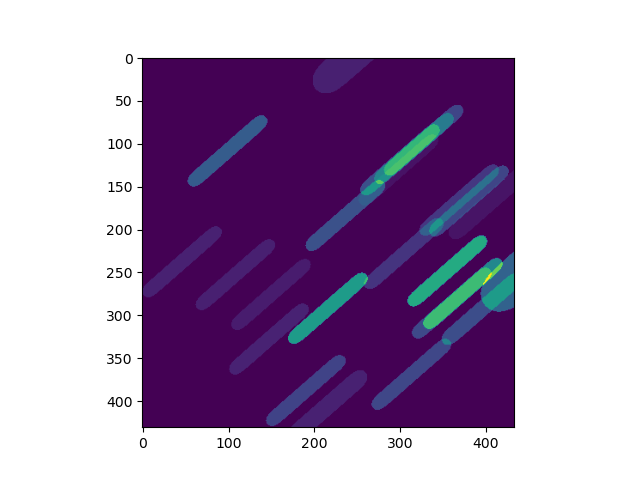

In [91]:
plt.figure()
plt.imshow(scale_cube.weights[i],origin)

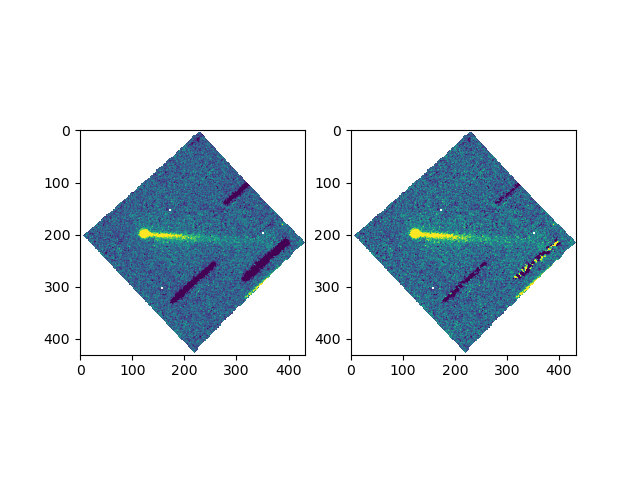

In [36]:
i = 3000
plt.figure()
plt.subplot(121)
plt.imshow(test.diff[i],vmin=-10,vmax=50)
plt.subplot(122)
plt.imshow(test.cube[i] - test.scene.sim[i]*cor[i],vmin=-10,vmax=50)

In [4]:
image = np.nanmean(test.cube,axis=0)

In [6]:
bright_mask = test.image > np.nanpercentile(test.image,90)

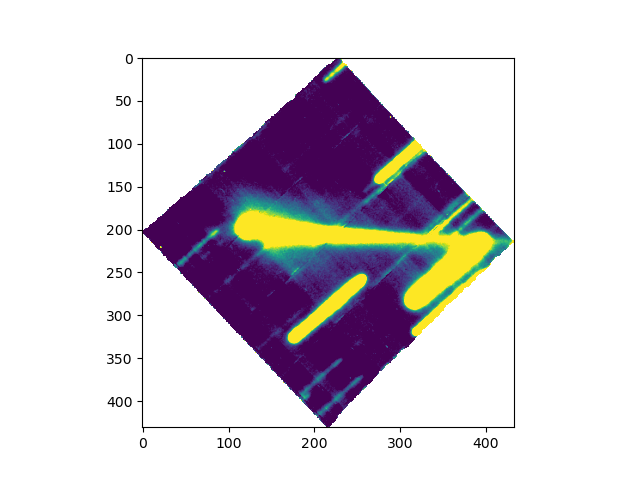

In [11]:
plt.figure()
plt.imshow(image - np.nanmedian(image[~bright_mask]),vmax=10,vmin=0)

In [2]:
test.psf_param

array([  4.61091659,   6.72536628,  15.55854533, -64.30453608])

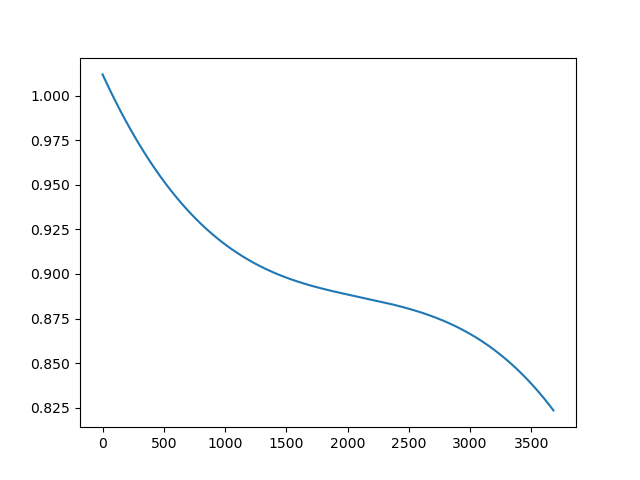

In [11]:
plt.figure()
plt.plot(test.flux_corr)

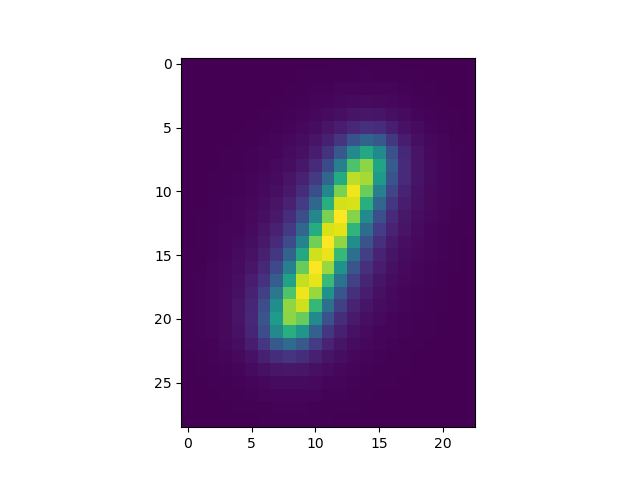

In [3]:
plt.figure()
plt.imshow(test.psf.longpsf)

In [8]:
test.x_length

9

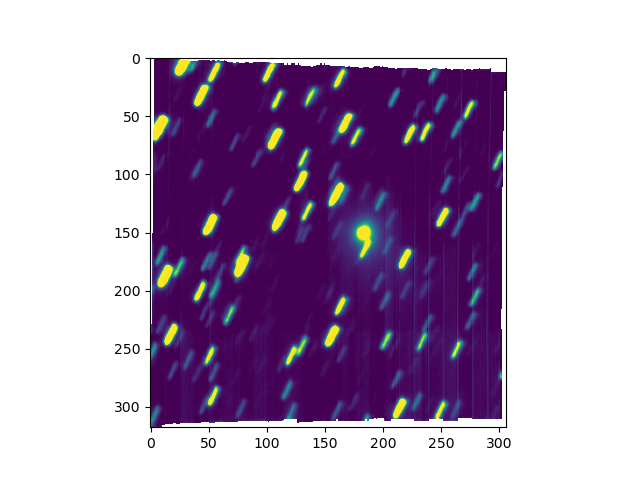

In [5]:
plt.figure()
plt.imshow(test.image,vmin=0,vmax=50)

In [2]:
cube = cube_simulator(test.cube,test.psf,catalogue=test.cat)

In [3]:
cube.mag_image()

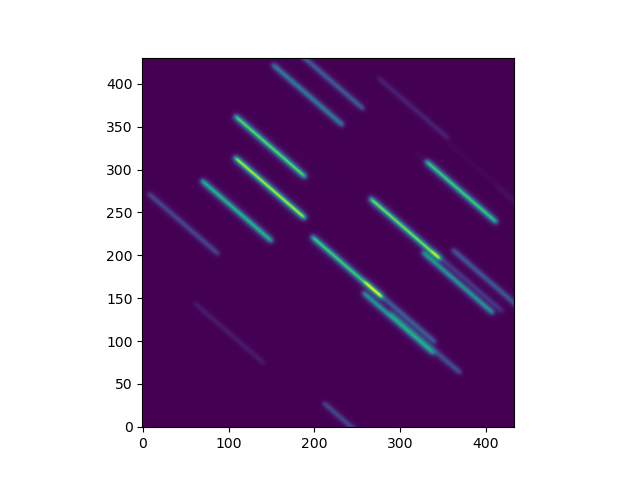

In [6]:
image = cube.image / np.nanmax(cube.image)
plt.figure()
plt.imshow(image,origin='lower')

In [29]:
psf_mask * 1.0 == 0

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])

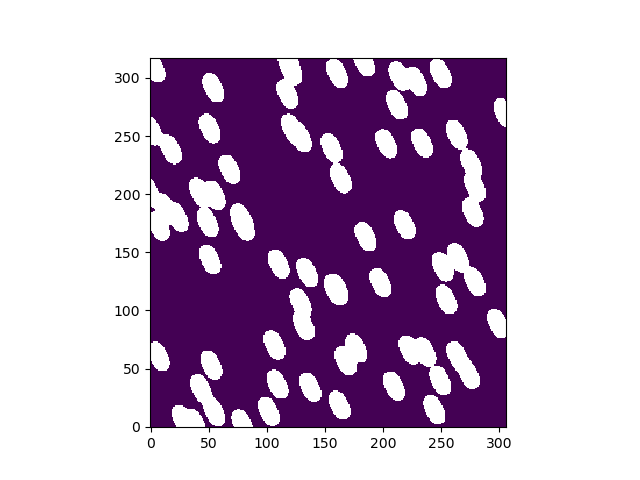

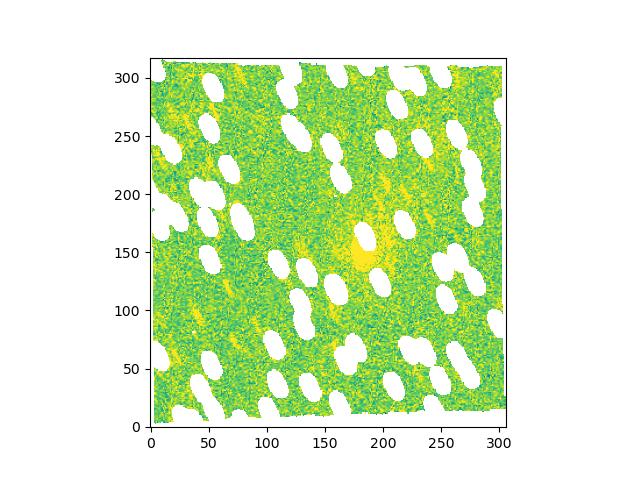

In [58]:
psf_mask = (test.scene.all_psfs < np.percentile(test.scene.all_psfs,80)) *1.0
psf_mask[psf_mask == 0] = np.nan
plt.figure()
plt.imshow(psf_mask,origin='lower')
plt.figure()
plt.imshow(psf_mask * test.cube[2000],origin='lower',vmax=10)
#plt.plot(test.cat['xint'],test.cat['yint'],'.')
#plt.plot(test.cat['x'],test.cat['y'],'.')

In [59]:
from scipy.interpolate import interp1d

In [68]:
from scipy.interpolate import make_lsq_spline, BSpline
t = [-1, 0, 1]
k = 3
t = np.r_[(x[nonan][0],)*(k+1),
          t,
          (x[nonan][-1],)*(k+1)]
spl = make_lsq_spline(x[nonan], y[nonan], t, k)

ValueError: Expect t to be a 1-D sorted array_like.

In [97]:
i = 1000
ybkg = np.zeros_like(psf_mask) * np.nan
masked = test.cube[i] * psf_mask
for j in range(psf_mask.shape[1]):

    x = np.arange(psf_mask.shape[0])
    y = masked[:,j]

    nonan = np.isfinite(y)
    if np.sum(nonan) > 5:
        filled = interp1d(x[nonan],y[nonan],bounds_error=False,kind='linear')
        extrapo = interp1d(x[nonan],y[nonan],bounds_error=False,fill_value='extrapolate',kind='nearest')
        filled = filled(x)
        filled[np.isnan(filled)] = extrapo(x)[np.isnan(filled)]
        ybkg[:,j] = filled
    
xbkg = np.zeros_like(psf_mask) * np.nan
for j in range(psf_mask.shape[0]):

    x = np.arange(psf_mask.shape[1])
    y = masked[j,:]

    nonan = np.isfinite(y)
    if np.sum(nonan) > 5:
        filled = interp1d(x[nonan],y[nonan],bounds_error=False,kind='linear')
        extrapo = interp1d(x[nonan],y[nonan],bounds_error=False,fill_value='extrapolate',kind='nearest')
        filled = filled(x)
        filled[np.isnan(filled)] = extrapo(x)[np.isnan(filled)]
        xbkg[j,:] = filled

In [98]:
xbkg

array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [12.27084351, 12.27084351, 12.27084351, ..., 18.76114082,
        18.76114082, 18.76114082],
       ...,
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])

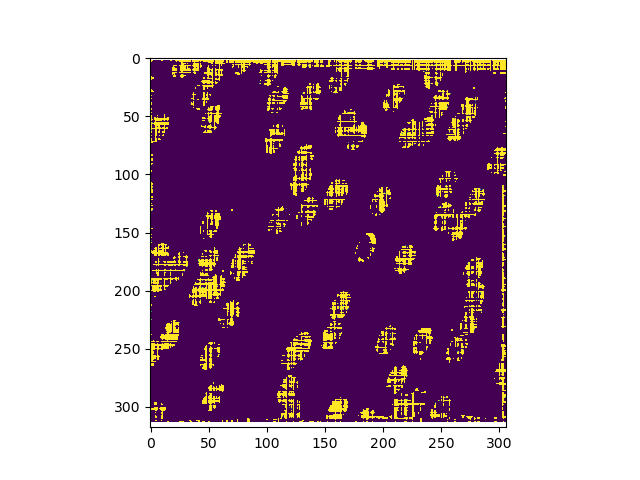

In [102]:
plt.figure()
plt.imshow(xbkg-ybkg,vmin=.9,vmax=1.1)

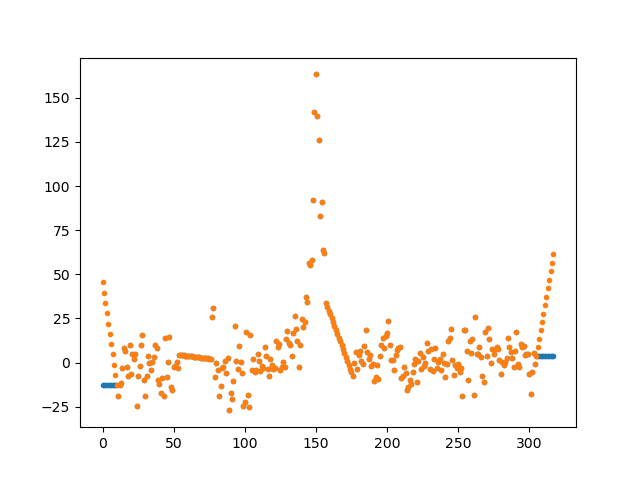

In [88]:
plt.figure()
plt.plot(x,filled,'.')
plt.plot(x,spl_i(x),'.')

In [40]:
x.shape

(318,)

In [39]:
y.shape

(306,)

In [48]:
thingo = psf_mask * test.image
a = deepcopy(thingo)
a[a==0] = np.nan
med = np.nanmedian(a)
thingo -= med
thingo[np.isnan(thingo)] = 0
thingo[thingo==med] = np.nan


x = np.arange(0, thingo.shape[1])
y = np.arange(0, thingo.shape[0])
arr = np.ma.masked_invalid(thingo)
xx, yy = np.meshgrid(x, y)
#get only the valid values
x1 = xx[~arr.mask]
y1 = yy[~arr.mask]
newarr = arr[~arr.mask]

In [49]:
estimate = griddata((x1, y1), newarr.ravel(),
                          (xx, yy),method='linear')
nearest = griddata((x1, y1), newarr.ravel(),
                          (xx, yy),method='nearest')

estimate[np.isnan(estimate)] = nearest[np.isnan(estimate)]
inds = np.where(np.isnan(test.image))
estimate[inds] = np.nan

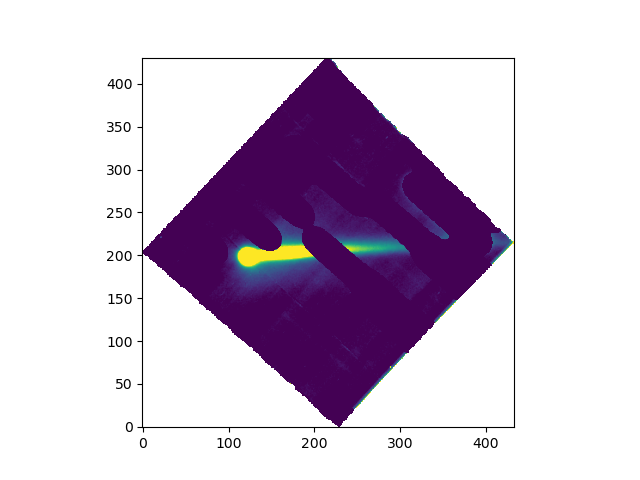

In [50]:
plt.figure()
plt.imshow(estimate,vmax = 30,vmin=0,origin='lower')

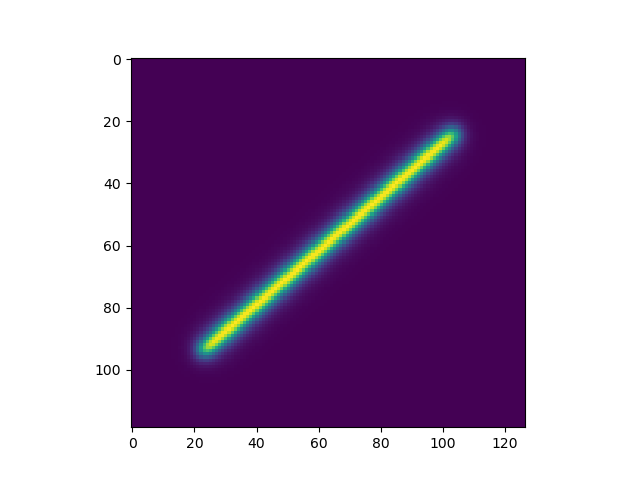

In [3]:
plt.figure()
plt.imshow(test.psf.longpsf)

In [3]:
test.psf.length

138.1904163273993

In [9]:
test.psf.length/test.psf.length_o

1.0

In [13]:
test.cat.keys()

Index(['_q', 'ra', 'dec', 'Source', 'e_RA_ICRS', 'e_DE_ICRS', 'Plx', 'e_Plx',
       'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag',
       'FBP', 'e_FBP', 'BPmag', 'FRP', 'e_FRP', 'RPmag', 'BP-RP', 'RV', 'e_RV',
       'Vbroad', 'GRVSmag', 'QSO', 'Gal', 'NSS', 'XPcont', 'XPsamp', 'RVS',
       'EpochPh', 'EpochRV', 'MCMCGSP', 'MCMCMSC', 'And', 'Teff', 'logg',
       '__Fe_H_', 'Dist', 'A0', 'HIP', 'PS1', 'SDSS13', 'SKYM2', 'TYC2',
       'URAT1', 'AllWISE', 'APASS9', 'GSC23', 'RAVE5', '_2MASS', 'RAVE6',
       'RAJ2000', 'DEJ2000', 'x', 'y', 'xint', 'yint', 'cal_source',
       'x_offset', 'y_offset'],
      dtype='object')

In [11]:
test.dec

array(-35.543405)

In [4]:
test.psf.angle_o

-63.545237417661575

In [10]:
test.trail

21.517121105908316

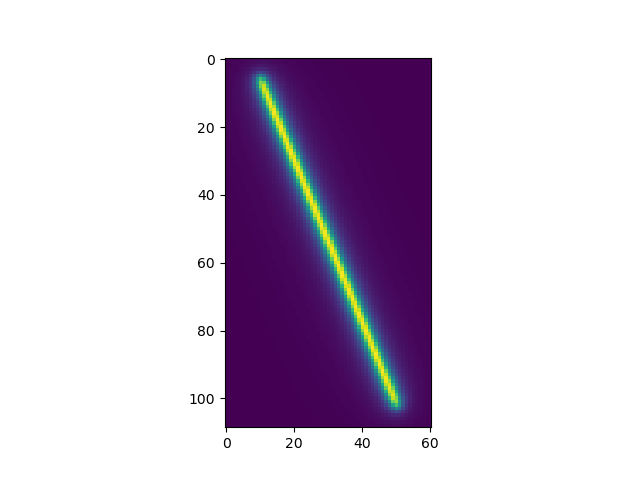

In [3]:
plt.figure()
plt.imshow(test.psf.longpsf)

In [6]:
test.psf.angle

656.2448629752863

In [6]:
import numpy as np

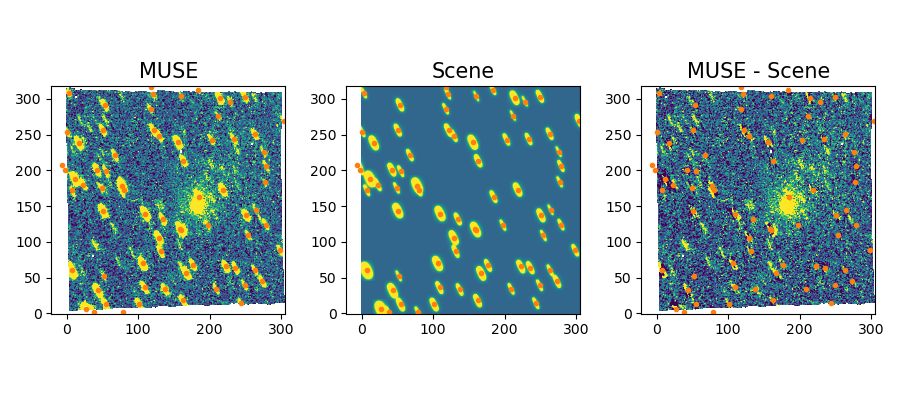

In [5]:
ind = 1800
image = test.cube[ind]
scene = test.scene.sim[ind]
diff = test.diff[ind]

vmin = np.nanpercentile(image,10)
vmax = np.nanpercentile(image,90)

x = test.cat.xint + test.cat.x_offset
y = test.cat.yint + test.cat.y_offset

plt.figure(figsize=(9,4))
plt.subplot(131)
plt.title('MUSE',fontsize=15)
plt.imshow(image,origin='lower',vmin=vmin,vmax=vmax)
plt.plot(x,y,'C1.')

plt.subplot(132)
plt.title('Scene',fontsize=15)
plt.imshow(scene,origin='lower',vmin=vmin,vmax=vmax)
plt.plot(x,y,'C1.')

plt.subplot(133)
plt.title('MUSE - Scene',fontsize=15)
plt.imshow(diff,origin='lower',vmin=vmin,vmax=vmax)
plt.plot(x,y,'C1.')

plt.tight_layout()
name = test.savepath +  test.file.split('/')[-1].split('.fits')[0] + '_sub.png'
#plt.savefig(name,bbox_inches='tight')

In [7]:
np.nanmax(test.cat.x_offset)

4.963218014180896

(array([ 2.,  2.,  0.,  0.,  1.,  1.,  3., 21., 26., 11.,  1.,  1.,  0.,
         1.,  0.,  1.,  0.,  0.,  0.,  1.]),
 array([-4.97865649, -4.48156276, -3.98446904, -3.48737531, -2.99028159,
        -2.49318786, -1.99609414, -1.49900041, -1.00190669, -0.50481296,
        -0.00771924,  0.48937449,  0.98646821,  1.48356194,  1.98065566,
         2.47774939,  2.97484311,  3.47193684,  3.96903056,  4.46612429,
         4.96321801]),
 <BarContainer object of 20 artists>)

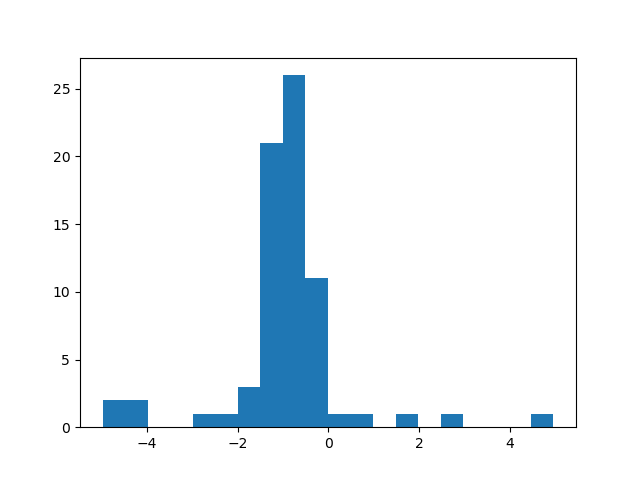

In [9]:
plt.figure()
plt.hist(test.cat.x_offset,bins=20)

round 1:  [25.33912002 -4.02762838  0.        ]
round 2:  [25.33911202 -4.02761519  0.        ]


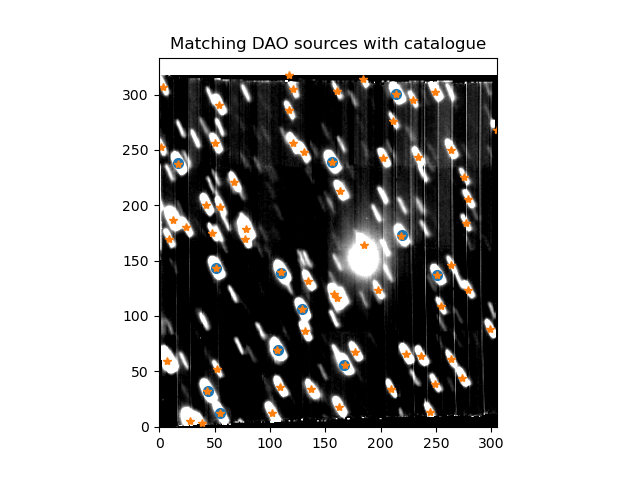

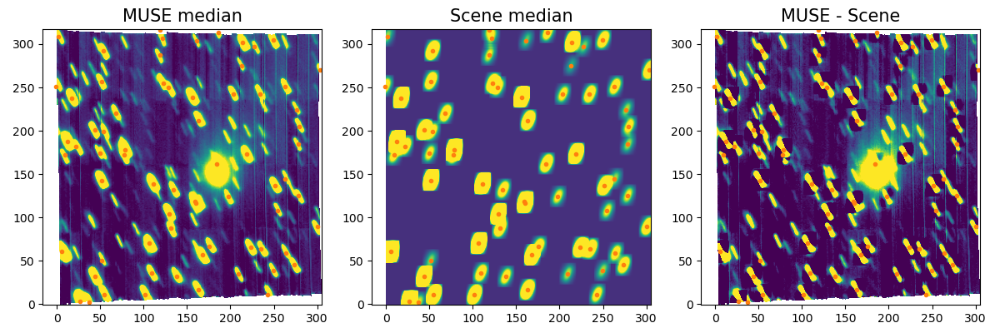

In [13]:
test2 = cuber(file='2I_DATACUBE_FINAL_2020-03-19T05:46:49.016.fits')

In [14]:
test2.angle

56.309932474020215

In [3]:
import matplotlib.pyplot as plt
%matplotlib widget

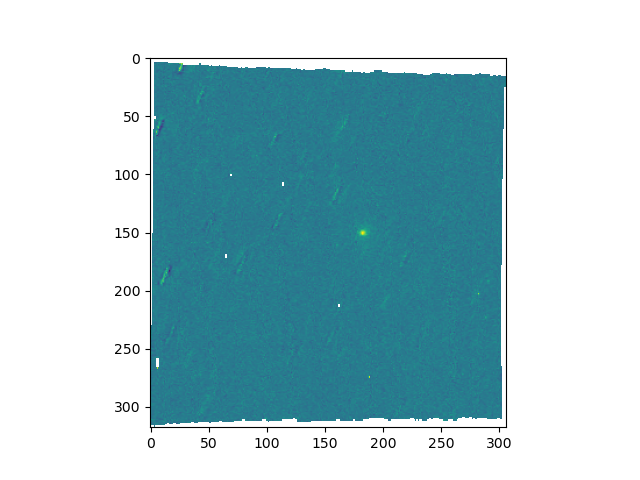

In [7]:
plt.figure()
plt.imshow(test.diff[-100])

In [8]:
!ls

2I_DATACUBE_FINAL_2019-12-31T06:22:04.886.fits
2I_DATACUBE_FINAL_2020-03-19T05:46:49.016.fits
2I_DATACUBE_FINAL_2020-03-19T05:46:49.016_diff.fits
2I_DATACUBE_FINAL_2020-03-19T05:46:49.016_sub.pdf
Gaia_spec.ipynb
Spec_match_example.png
Untitled.ipynb
__pycache__
explore.ipynb
extinction.png
first_scene.png
first_scene_sub.png
first_scene_sub_full.pdf
first_scene_sub_full.png
line_psf.py
model_figs
psf_shift_working.pdf
psf_shift_working.png
residuals
scaled_spec.png
spec_calibration.pdf
spec_figs
test_wcs.axy
